# Africa Covid -19 Forecasting

Here, we make some review of all we know on covid-19 and study the covid 19 in Africa. Our work will be presented as follows:

1- **Plot Covid-19 in worldwide map, each continent and  SARS-Cov 2 Bilan**

2- **Africa: Prophet, SIR Model adapted, Diffusion reaction equation, Polynomial regression or XgboostRegression.**

3- **Find $R_{0}$ if possible**

4- **Var Model for new Confirmed, Recovered and Deaths**

5- **Impulse-Response function**

6- **Forecasting**

Now let's start

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# Any results you write to the current directory are saved as output.

/kaggle/input/corona-virus-report/covid_19_clean_complete.csv
/kaggle/input/corona-virus-report/country_wise_latest.csv
/kaggle/input/corona-virus-report/day_wise.csv
/kaggle/input/corona-virus-report/usa_county_wise.csv
/kaggle/input/corona-virus-report/worldometer_data.csv
/kaggle/input/corona-virus-report/full_grouped.csv
/kaggle/input/novel-corona-virus-2019-dataset/time_series_covid_19_deaths_US.csv
/kaggle/input/novel-corona-virus-2019-dataset/time_series_covid_19_recovered.csv
/kaggle/input/novel-corona-virus-2019-dataset/time_series_covid_19_confirmed_US.csv
/kaggle/input/novel-corona-virus-2019-dataset/covid_19_data.csv
/kaggle/input/novel-corona-virus-2019-dataset/time_series_covid_19_confirmed.csv
/kaggle/input/novel-corona-virus-2019-dataset/time_series_covid_19_deaths.csv


In [2]:
# import package
import matplotlib.pyplot as plt
import seaborn as sns 
import statsmodels as sm
import folium as fl
#import vincent 
from pathlib import Path
from sklearn.impute import SimpleImputer
import geopandas as gpd
import mapclassify as mpc
import warnings
import plotly.offline as py
import plotly.express as px
import cufflinks as cf

In [3]:
%matplotlib inline
pd.options.plotting.backend
#pd.plotting.register_matplotlib_converters()
gpd.plotting.plot_linestring_collection
py.init_notebook_mode(connected=False)
cf.set_config_file(offline=True)
sns.set()
warnings.filterwarnings('ignore')

In [4]:
geofile = '/kaggle/input/corona-virus-report/covid_19_clean_complete.csv'
covidfile = '/kaggle/input/novel-corona-virus-2019-dataset/covid_19_data.csv'

In [5]:
geospatial = pd.read_csv(geofile, parse_dates=True)
covid19 = pd.read_csv(covidfile, parse_dates=True)

In [6]:
geospatial.head(3)

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,WHO Region
0,NaN,Afghanistan,33.93911,67.709953,2020-01-22,0,0,0,0,Eastern Mediterranean
1,NaN,Albania,41.15330,20.168300,2020-01-22,0,0,0,0,Europe
2,NaN,Algeria,28.03390,1.659600,2020-01-22,0,0,0,0,Africa


In [7]:
covid19.head(3)

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
0,1,01/22/2020,Anhui,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
1,2,01/22/2020,Beijing,Mainland China,1/22/2020 17:00,14.0,0.0,0.0
2,3,01/22/2020,Chongqing,Mainland China,1/22/2020 17:00,6.0,0.0,0.0


## cleaning data

In [8]:
covid19.isnull().sum()[covid19.isnull().sum()>0]

Province/State    72989
dtype: int64

In [9]:
geospatial.isnull().sum()[geospatial.isnull().sum()>0]

Province/State    34404
dtype: int64

In [10]:
covid19.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 285307 entries, 0 to 285306
Data columns (total 8 columns):
SNo                285307 non-null int64
ObservationDate    285307 non-null object
Province/State     212318 non-null object
Country/Region     285307 non-null object
Last Update        285307 non-null object
Confirmed          285307 non-null float64
Deaths             285307 non-null float64
Recovered          285307 non-null float64
dtypes: float64(3), int64(1), object(4)
memory usage: 17.4+ MB


In [11]:
geospatial.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49068 entries, 0 to 49067
Data columns (total 10 columns):
Province/State    14664 non-null object
Country/Region    49068 non-null object
Lat               49068 non-null float64
Long              49068 non-null float64
Date              49068 non-null object
Confirmed         49068 non-null int64
Deaths            49068 non-null int64
Recovered         49068 non-null int64
Active            49068 non-null int64
WHO Region        49068 non-null object
dtypes: float64(2), int64(4), object(4)
memory usage: 3.7+ MB


In [12]:
geospatial['Date'] = pd.to_datetime(geospatial['Date'])
covid19['ObservationDate'] = pd.to_datetime(covid19['ObservationDate'])
covid19['CurrentConfirmed'] = covid19['Confirmed'] - covid19['Deaths'] - covid19['Recovered']

In [13]:
#covid19['ObservationDate'].unique()

In [14]:
replace = ['Dem. Rep. Congo', "Côte d'Ivoire", 'Congo', 'United Kingdom', 'China','Central African Rep.',
          'Eq. Guinea','eSwatini','Bosnia and Herz.', 'S. Sudan', 'Dominican Rep.', 'W. Sahara',
          'United States of America']

name = ['Congo (Kinshasa)', 'Ivory Coast', 'Congo (Brazzaville)', 'UK', 'Mainland China', 
        'Central African Republic', 'Equatorial Guinea', 'Eswatini', 'Bosnia and Herzegovina', 'South Sudan',
       'Dominica', 'Western Sahara','US']

In [15]:
geo_data = geospatial.drop(columns=['Province/State'])
covid_data = covid19.drop(columns=['Province/State'])
covid_data = covid_data.replace(to_replace=name, value=replace)
geo_data = geo_data.replace(to_replace=name, value=replace)

# END Cleaning

# Covid-19 in each Continent

### COVID-19 Worldwide Map

We use geospatial to see how covid19 spreads across the world.

In [16]:
gb_covid = covid_data.groupby('ObservationDate')[['Confirmed', 'Deaths', 'Recovered',
                                                  'CurrentConfirmed']].agg('sum')

In [17]:
dataCovid = covid_data.groupby(['Country/Region', 'ObservationDate'])[['Confirmed', 'Deaths', 'Recovered',
                                                  'CurrentConfirmed']].agg('sum').reset_index()

In [18]:
dataCovid.head()

,Country/Region,ObservationDate,Confirmed,Deaths,Recovered,CurrentConfirmed
0,Azerbaijan,2020-02-28,1.0,0.0,0.0,1.0
1,"('St. Martin',)",2020-03-10,2.0,0.0,0.0,2.0
2,Afghanistan,2020-02-24,1.0,0.0,0.0,1.0
3,Afghanistan,2020-02-25,1.0,0.0,0.0,1.0
4,Afghanistan,2020-02-26,1.0,0.0,0.0,1.0


In [19]:
print('========= COVID-19 Worldwide ==============================')
print("======== Report to date {} ===============\n".format(gb_covid.index.max()))
print('1- The number of country that are affected by COVID-19: {}'.format(len(covid_data['Country/Region'].unique())))
print('2- Total Confirmed: {}'.format(gb_covid['Confirmed'][gb_covid.index == gb_covid.index.max()].values[-1]))
print('3- Total Deaths: {}'.format(gb_covid['Deaths'][gb_covid.index==gb_covid.index.max()].values[-1]))
print('4- Total Recovered: {}'.format(gb_covid['Recovered'][gb_covid.index ==gb_covid.index.max()].values[-1]))
print('5- Total CurrentConfirmed: {}'.format(gb_covid['CurrentConfirmed'][gb_covid.index==gb_covid.index.max()]\
                                             .values[-1]))
print('============================================================')

========= COVID-19 Worldwide ==============================
======== Report to date 2021-05-02 00:00:00 ===============

1- The number of country that are affected by COVID-19: 227
2- Total Confirmed: 152502340.0
3- Total Deaths: 3199106.0
4- Total Recovered: 89311961.0
5- Total CurrentConfirmed: 59991273.0


In [20]:
gb_covid.Confirmed.iplot(kind='bar', legend=True, colors='Blue', title='Novel COVID-19 in the Worldwide',
                        yTitle='Total Confirmed')

In [21]:
# we convert the dataframe to geodataframe
geoCovid = gpd.GeoDataFrame(geo_data, geometry=gpd.points_from_xy(geo_data.Long, geo_data.Lat))

In [22]:
#Set the coordinate reference system (crs)to EPSG 4326
geoCovid.crs = 'epsg:4326'

In [23]:
geoCovid.head(3)

,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,WHO Region,geometry
0,Afghanistan,33.93911,67.709953,2020-01-22,0,0,0,0,Eastern Mediterranean,POINT (67.70995 33.93911)
1,Albania,41.15330,20.168300,2020-01-22,0,0,0,0,Europe,POINT (20.16830 41.15330)
2,Algeria,28.03390,1.659600,2020-01-22,0,0,0,0,Africa,POINT (1.65960 28.03390)


In [24]:
#plot the worldwide covid19
world_path_file = gpd.datasets.get_path('naturalearth_lowres') # upload natural data map
world = gpd.read_file(world_path_file)
world.head(3)

,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,920938,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,53950935,Africa,Tanzania,TZA,150600.0,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,603253,Africa,W. Sahara,ESH,906.5,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."


In [25]:
need_data = dataCovid[dataCovid.ObservationDate == dataCovid.ObservationDate.max()]

In [26]:
need_data.head()

,Country/Region,ObservationDate,Confirmed,Deaths,Recovered,CurrentConfirmed
435,Afghanistan,2021-05-02,60122.0,2637.0,53391.0,4094.0
855,Albania,2021-05-02,131238.0,2397.0,110920.0,17921.0
1288,Algeria,2021-05-02,122522.0,3270.0,85398.0,33854.0
1715,Andorra,2021-05-02,13282.0,127.0,12753.0,402.0
2124,Angola,2021-05-02,26993.0,602.0,23913.0,2478.0


In [27]:
geo_merged = world.merge(need_data[['Country/Region','Confirmed','Deaths','Recovered','CurrentConfirmed']] , 
                     left_on='name', right_on='Country/Region')

In [28]:
geo_merged.head(3)

,pop_est,continent,name,iso_a3,gdp_md_est,geometry,Country/Region,Confirmed,Deaths,Recovered,CurrentConfirmed
0,920938,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000...",Fiji,119.0,2.0,68.0,49.0
1,53950935,Africa,Tanzania,TZA,150600.0,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982...",Tanzania,509.0,21.0,183.0,305.0
2,35623680,North America,Canada,CAN,1674000.0,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742...",Canada,1240878.0,24269.0,1137041.0,79568.0


In [29]:
geo_merged.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 161 entries, 0 to 160
Data columns (total 11 columns):
pop_est             161 non-null int64
continent           161 non-null object
name                161 non-null object
iso_a3              161 non-null object
gdp_md_est          161 non-null float64
geometry            161 non-null geometry
Country/Region      161 non-null object
Confirmed           161 non-null float64
Deaths              161 non-null float64
Recovered           161 non-null float64
CurrentConfirmed    161 non-null float64
dtypes: float64(5), geometry(1), int64(1), object(4)
memory usage: 15.1+ KB


Text(0.5, 1.0, 'SARS-Cov 2 in the worldwide')

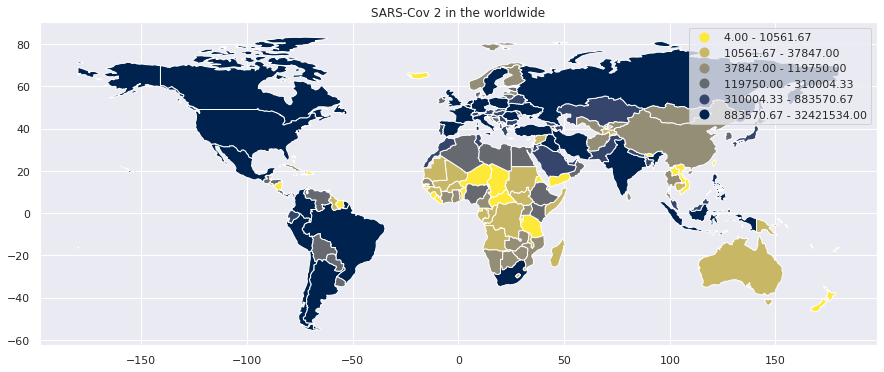

In [30]:
geo_merged.plot(cmap='cividis_r', column='Confirmed', legend=True, figsize=(15,9), scheme='quantiles', k=6)
plt.title('SARS-Cov 2 in the worldwide')

Text(0.5, 1.0, 'The spreading of COVID-19 Mortality in the World')

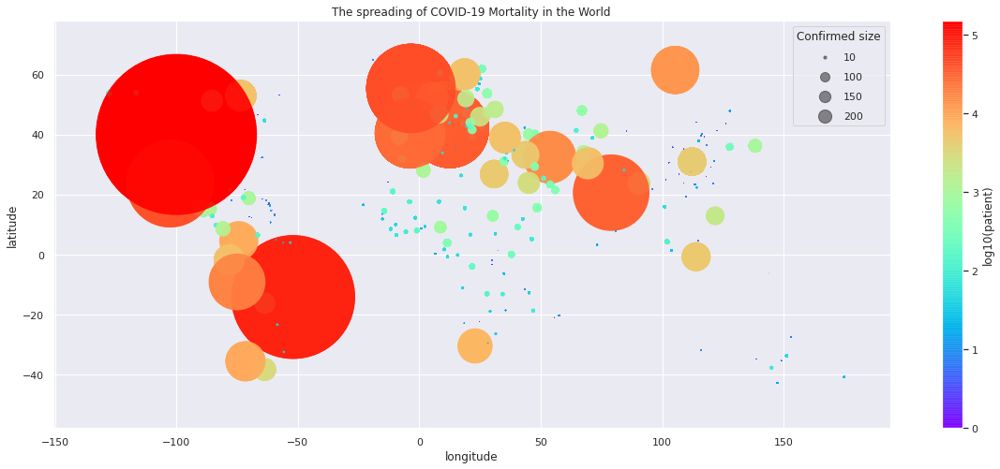

In [31]:
#usa = geoCovid[geoCovid['Country/Region']=='USA']
pworld = geoCovid.copy()
lat_world = pworld.Lat
lon_world = pworld.Long
pa_world = pworld.Deaths

#pa_usa = usa.Confirmed
#lat_usa = usa.Lat
#lon_usa = usa.Long

patient = geoCovid.Deaths

# Scatter the points, using size and color but no label
plt.figure(figsize=(20,8))
#plt.scatter(lon_usa, lat_usa, label=None, c=np.log(pa_usa+1),cmap='cividis_r',s=pa_usa/50,\
           # linewidth=0, alpha=0.9)
plt.scatter(lon_world, lat_world, label=None, c=np.log10(pa_world+1), cmap='rainbow', s=pa_world/5,\
            linewidth=0, alpha=0.9)
plt.axis(aspect='equal')
plt.xlabel('longitude')
plt.ylabel('latitude')
plt.colorbar(label='log10(patient)')
#plt.clim(3, 7)

for id in [10, 100, 150, 200]:
    plt.scatter([], [], c='k', alpha=0.5, s=id, label = str(id))
plt.legend(scatterpoints=1, frameon=True, labelspacing=1, title='Confirmed size')
plt.title('The spreading of COVID-19 Mortality in the World')

**Some Remark**

1- Covid-19 likes moving along latitude and cool climat country or continent but moreless in heat continent like Africa.

2- Covid-19 likes moving along rich countries, mega cities which have huge population and high healthcare (There exist another reason for that).

3- Mortality is very high in Europe (before), North America and South America continent (Now).

When we see this graph, each big circle means the country or cities have a lot of people that are affected by covid-19. America continent are now more affected.

Since covid-19 has DNA, I think that if the northern countries are more affected by this virus it is because the climate or the environment of these countries allows the rapid development of the virus or else the obstacles encountered by this virus are not sufficient enough to prevent the virus from mutating. On the other hand in the hot regions here the African continent, we note indeed that there are not enough cases (except South Africa); perhaps it is due to the diverse climate of Africa or the countries of this continent. Due to the diversity of the African climate or environment, the virus probably has trouble mutating quickly because at each mutation (resolution of the problem in the face of an obstacle by the virus: the virus adapts) the virus is always mutated because of the complexity that the African environment brings (except South Africa). Another continent with a similarity with Africa (I can be wrong) is the continent Oceania.

Even if the SARS Cov 2 cannot move quickly in the African environment(except South Africa). We should be vigilant. one of the measures that could stop the spread of the disease in Africa is Barrier measure.

Text(0.5, 1.0, 'Covid19 worldwide density')

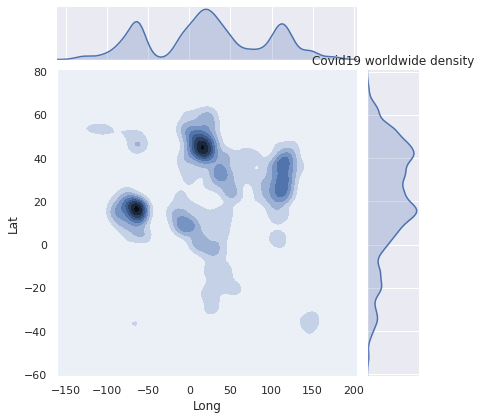

In [32]:
#latitude & longitude
sns.jointplot(x=pworld.Long, y=pworld.Lat, data=pworld, kind='kde', annot_kws=dict(stat="r"))
plt.title('Covid19 worldwide density')

From this graph, we see well that Northern America and Europe contiment are more affected by covid-19.

### Confirmed, Recovered and Deaths by continent

In [33]:
world.continent.unique()

array(['Oceania', 'Africa', 'North America', 'Asia', 'South America',
       'Europe', 'Seven seas (open ocean)', 'Antarctica'], dtype=object)

We take each continent

In [34]:
#asia = world.loc[world['continent'].isin(['Asia'])]
#africa = world.loc[world['continent'].isin(['Africa'])]
#europe = world.loc[world['continent'].isin(['Europe'])]
#north_america = world.loc[world['continent'].isin(['North America'])]
#south_america = world.loc[world['continent'].isin(['South America'])]
#oceania = world.loc[world['continent'].isin(['Oceania'])]
#sevenSea = world.loc[world['continent'].isin(['Seven seas (open ocean)'])]

#### SARS-COV Information

In [35]:
#take each contry
#asia_cov = covid_data[covid_data['Country/Region'].isin(asia.name)]

In [36]:
def continent_Infos(continent=None, sars_cov = covid_data, geo_sars_cov = geoCovid, World = geo_merged):
    
    ''' This function give some information on
        evolution of SARS-Cov in each continent
        
        params: continent: name of continent
        parans: sars_cov have covid data
        params: geo_sars_cov: geospatial srs cov 2
        params: world: worldwide data
        
        return
        plot each continent Map
        bilan on SARS-Cov daily
        plot confirmed curve
        plot confirmed country
        
    '''
    
    
    Map = World.loc[World['continent'].isin([continent])]
    #take each country
    
    #if continent == 'Asia':
     #   sars_cov = sars_cov.replace(to_replace='Mainland China', value='China')
    
   # elif continent == 'North America' :
    #    sars_cov = sars_cov.replace(to_replace='US', value='United States of America')
     #   geo_sars_cov = geo_sars_cov.replace(to_replace='US', value='United States of America')
        
    #else:
     #   pass
    
    #map_cov = geo_sars_cov[geo_sars_cov['Country/Region'].isin(Map.name)] # take each country
    
    x = sars_cov[sars_cov['Country/Region'].isin(Map.name)] # take covid19 country
    
    xdata = x.groupby('ObservationDate')[['Confirmed','Recovered','Deaths','CurrentConfirmed']].agg('sum')
    day = xdata.index.max()
    country = x[x['ObservationDate'] == day]
    
    cov2 = country.groupby('Country/Region')[['Confirmed','Recovered','Deaths','CurrentConfirmed']].agg('sum')
    corv = cov2.sort_values(by=['Confirmed'], ascending=False)
    
    print('====== {}: SARS-Cov 2 Information of {} ======\n'.format(continent, day))
    print('Total Confirmed: {}'.format(corv.Confirmed.sum()))
    print('Total Deaths: {}'.format(corv.Deaths.sum()))
    print('Total Recovered {}'.format(corv.Recovered.sum()))
    print('Total CurrentConfirmed {}'.format(corv.CurrentConfirmed.sum()))
    
    print('========================================================\n')
    
    ax = Map.plot(cmap='cividis_r', column='Confirmed', legend=True, figsize=(15,15), scheme='quantiles', k=3)
    #map_cov.plot(ax=ax, markersize=20, legend=True, cmap='cividis_r', column='Confirmed')
    
    if continent == 'Oceania':
        ax.set_xlim([100, 200])
        ax.set_ylim([-50, 0])
        
    elif continent == 'Europe':
        ax.set_xlim([-100, 200])
        ax.set_ylim([0, 90])
        
    
    plt.title('SARS-COV 2 Confirmed cases in {} continent'.format(continent))
    plt.xlabel('Longitude')
    plt.ylabel('latitude')
    
    # confirmed curve date and country
    fig = plt.figure(figsize=(15,10))
    fig.subplots_adjust(hspace=0.4,wspace=0.2)
    ax1 = fig.add_subplot(2,1,1)
    ax2 = fig.add_subplot(2,1,2)
    xdata.plot(ax=ax1,legend=True, title='{}: SARS-Cov 2 time evolution'.format(continent))
    corv.plot(ax=ax2, legend=True, kind='bar', title='SARS-Cov 2 spreads across {} continent'.format(continent),
             logy=True)    
    
    ax = None
    map_cov = None
    xdata = None
    corv = None

In [37]:
#africa_cov = covid_data[covid_data['Country/Region'].isin(africa.name)]
#europe_cov = covid_data[covid_data['Country/Region'].isin(europe.name)]
#oceania_cov = covid_data[covid_data['Country/Region'].isin(oceania.name)]
#north_america_cov = covid_data[covid_data['Country/Region'].isin(north_america.name)]
#south_america_cov = covid_data[covid_data['Country/Region'].isin(south_america.name)]

====== Europe: SARS-Cov 2 Information of 2021-05-02 00:00:00 ======

Total Confirmed: 43140512.0
Total Deaths: 985397.0
Total Recovered 22086051.0
Total CurrentConfirmed 20069064.0

====== South America: SARS-Cov 2 Information of 2021-05-02 00:00:00 ======

Total Confirmed: 25078677.0
Total Deaths: 678778.0
Total Recovered 22542758.0
Total CurrentConfirmed 1857141.0

====== Asia: SARS-Cov 2 Information of 2021-05-02 00:00:00 ======

Total Confirmed: 39475702.0
Total Deaths: 519848.0
Total Recovered 33824648.0
Total CurrentConfirmed 5131206.0

====== Oceania: SARS-Cov 2 Information of 2021-05-02 00:00:00 ======

Total Confirmed: 43789.0
Total Deaths: 1054.0
Total Recovered 35444.0
Total CurrentConfirmed 7291.0

====== North America: SARS-Cov 2 Information of 2021-05-02 00:00:00 ======

Total Confirmed: 37347655.0
Total Deaths: 845614.0
Total Recovered 4084189.0
Total CurrentConfirmed 32417852.0

====== Africa: SARS-Cov 2 Information of 2021-05-02 00:00:00 ======

Total Confirmed: 453399

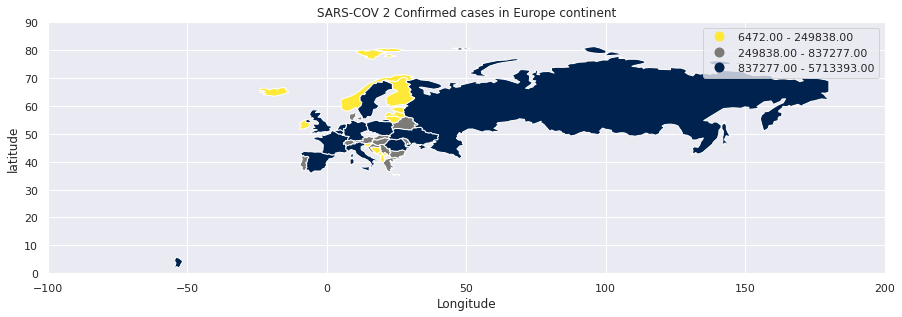

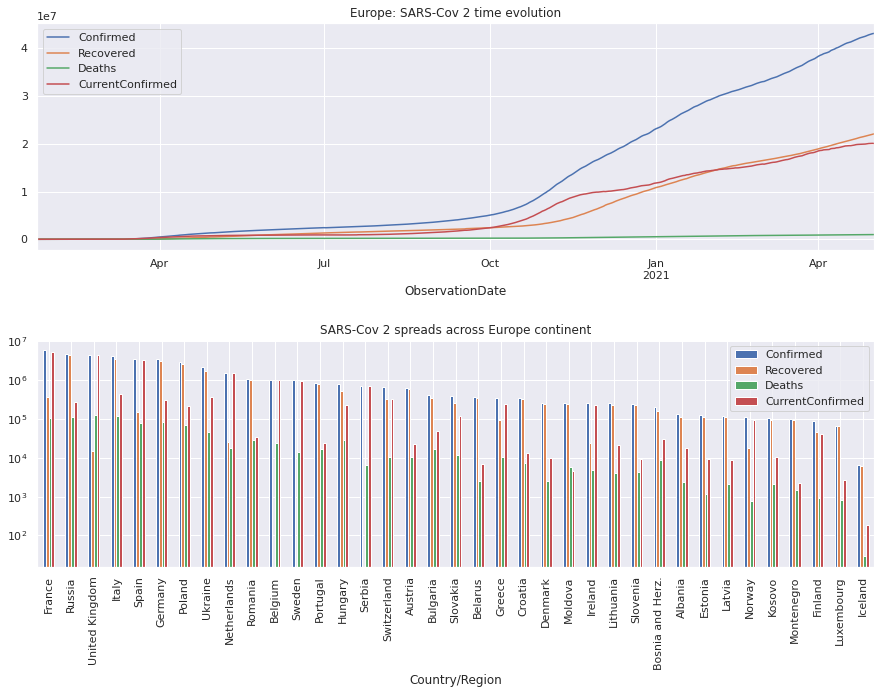

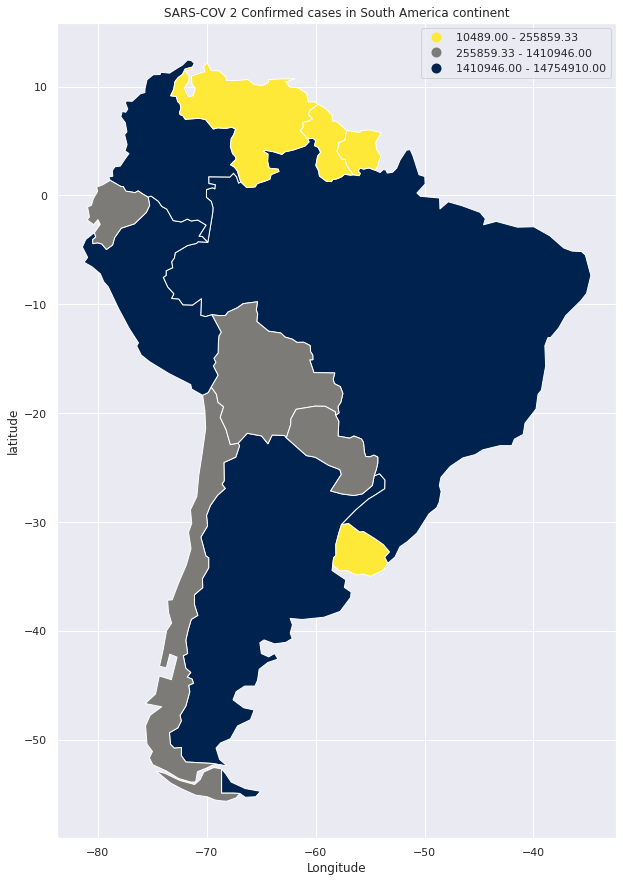

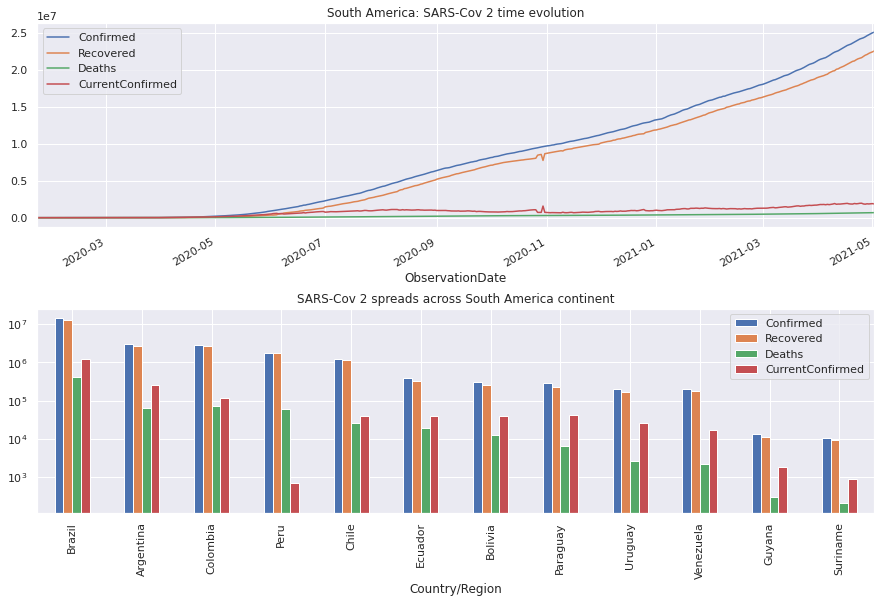

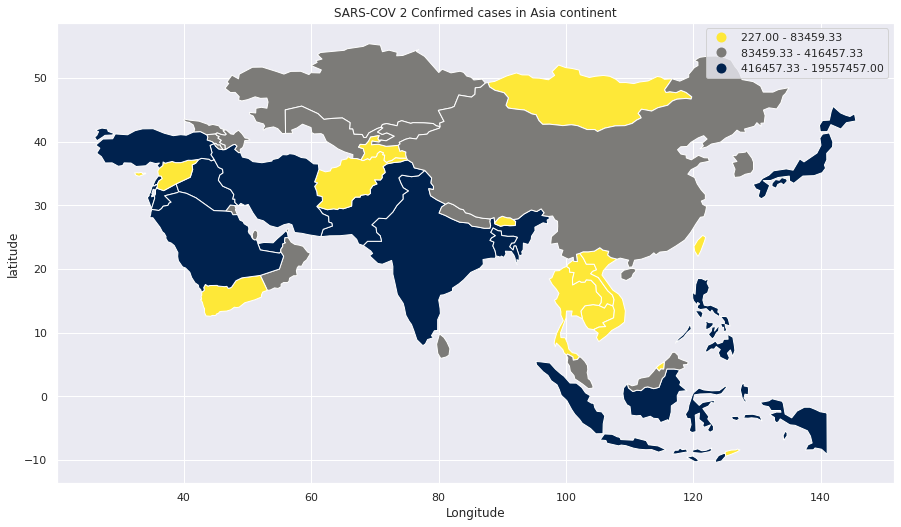

...

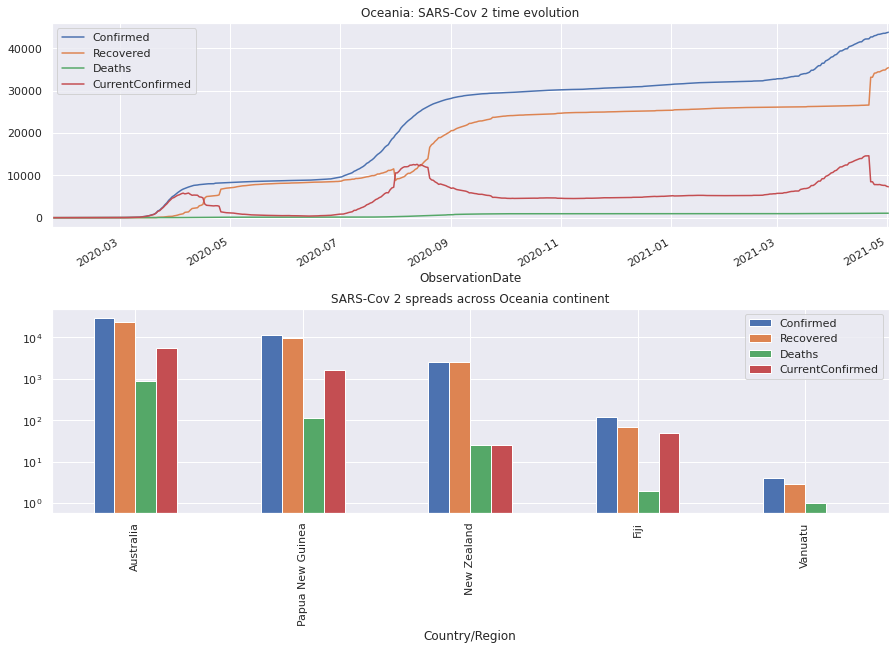

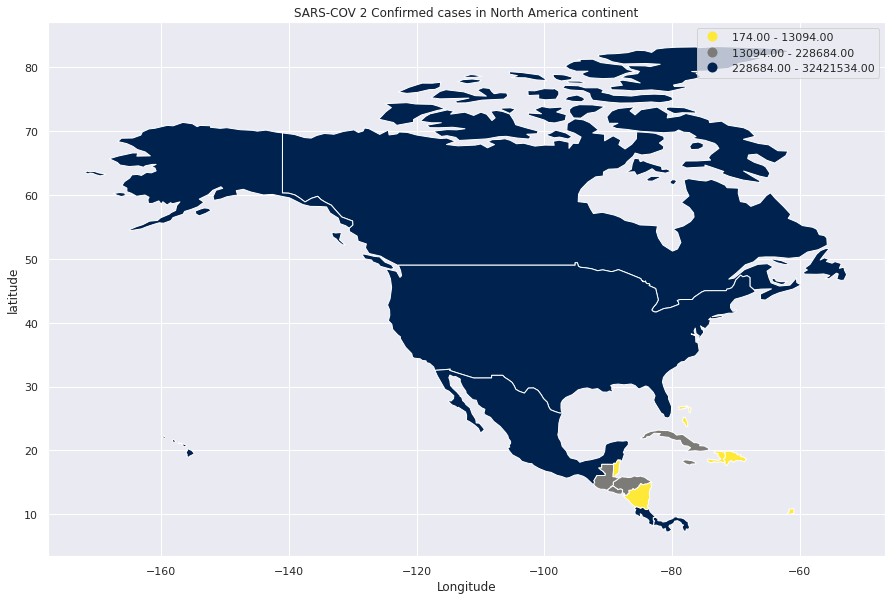

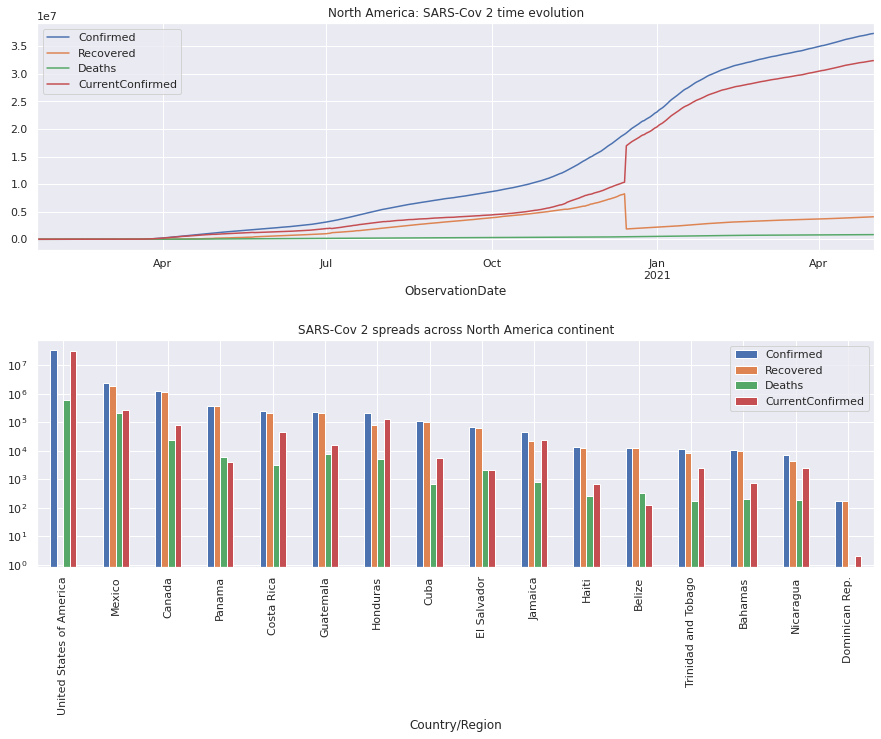

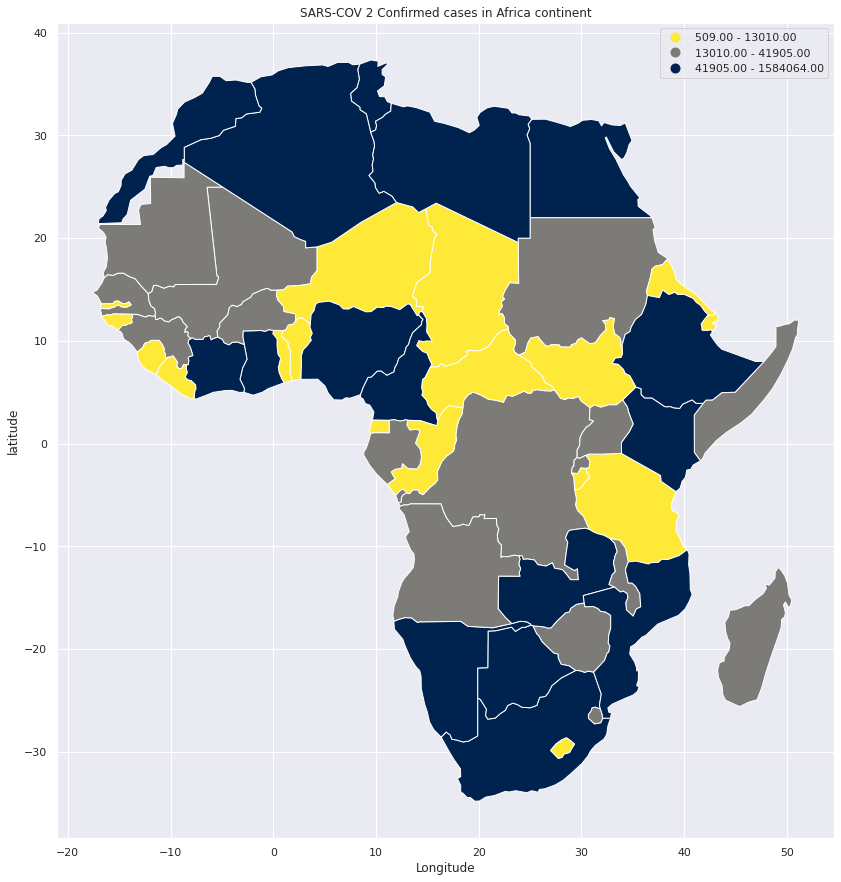

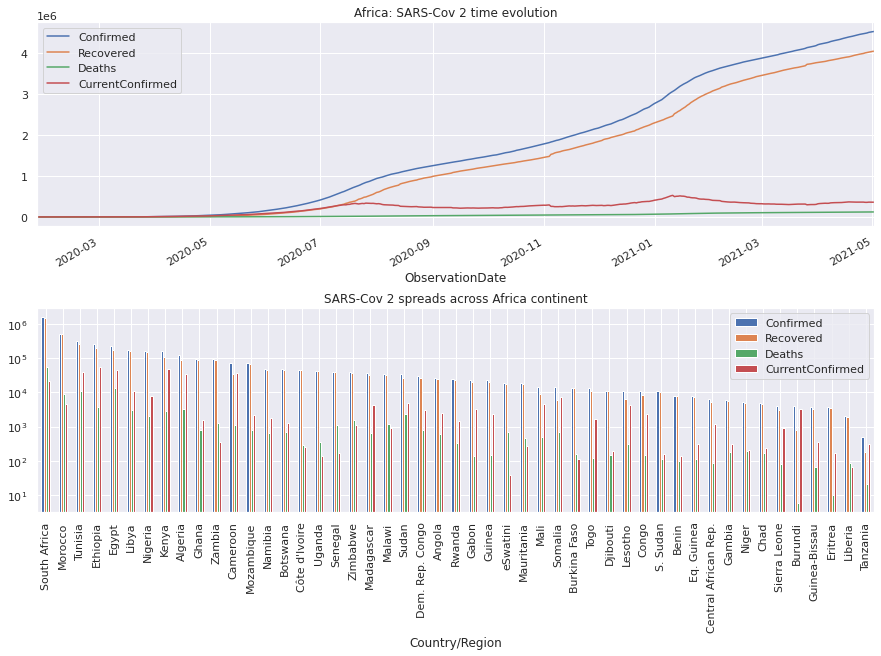

In [38]:
xcols = list(set(world.continent.unique()) - set(['Seven seas (open ocean)','Antarctica']))
for name in xcols:
    continent_Infos(continent=name)

### SARS-Cov 2 Bilan

In [39]:
def sarsCov2_bilan(continent=None, sars_cov = covid_data, geo_sars_cov = geoCovid, World = world ):
    
    ''' This function give some information on
        evolution of SARS-Cov in each continent
        
        params: continent: name of continent
        parans: sars_cov have covid data
        params: geo_sars_cov: geospatial sars cov 2
        params: world: worldwide data
        
        return
        plot each continent Map
        bilan on SARS-Cov daily
        plot confirmed curve
        plot confirmed country
        
    '''
    
    
    Map = World.loc[world['continent'].isin([continent])]
    #take each country
    
    if continent == 'Asia':
        sars_cov = sars_cov.replace(to_replace='Mainland China', value='China')
        
    elif continent == 'North America' :
        sars_cov = sars_cov.replace(to_replace='US', value='United States of America')
        geo_sars_cov = geo_sars_cov.replace(to_replace='US', value='United States of America')
        
    else:
        pass
    
    map_cov = geo_sars_cov[geo_sars_cov['Country/Region'].isin(Map.name)] # take each country
    
    x = sars_cov[sars_cov['Country/Region'].isin(Map.name)] # take covid19 country
    
    xdata = x.groupby('ObservationDate')[['Confirmed','Recovered','Deaths', 'CurrentConfirmed']].agg('sum')
    day = xdata.index.max() # take last day
    country = x[x['ObservationDate'] == day]
    
    cov2 = country.groupby('Country/Region')[['Confirmed','Recovered','Deaths', 'CurrentConfirmed']].agg('sum')
    corv = cov2.sort_values(by=['Confirmed'], ascending=False)    
    
    return [continent, corv.Confirmed.sum(), corv.Recovered.sum(), corv.Deaths.sum(), corv.CurrentConfirmed.sum()], xdata.reset_index()

In [40]:
pdata = {} #dictionary 
cont = [] # continent list
conf = [] # confirmed case list
rec = [] # recovered case list
dea = [] # deaths case list
cur = [] # active case list
for name in xcols:
    x, _ = sarsCov2_bilan(continent=name) # take a bilan of each continent in the world
    cont.append(x[0]) #
    conf.append(x[1])
    rec.append(x[2])
    dea.append(x[3])
    cur.append(x[4])
    
    
pdata['continent'] = cont
pdata['Confirmed'] = conf
pdata['Recovered'] = rec
pdata['Deaths'] = dea
pdata['CurrentConfirmed'] = cur

In [41]:
Earth = pd.DataFrame(pdata) # covid 19 in earth
Earth = Earth.sort_values(by=['Confirmed'],ascending=False)
Earth.style.background_gradient('viridis')

,continent,Confirmed,Recovered,Deaths,CurrentConfirmed
0,Europe,4.31405e+07,2.20861e+07,985397,2.00691e+07
2,Asia,3.94757e+07,3.38246e+07,519848,5.13121e+06
4,North America,3.73477e+07,4.08419e+06,845614,3.24179e+07
1,South America,2.50787e+07,2.25428e+07,678778,1.85714e+06
5,Africa,4.534e+06,4.05232e+06,121848,359825
3,Oceania,43789,35444,1054,7291


In [42]:
Earth.iplot(x='continent', title='SARS-Cov 2 in the Earth planet', legend=True, logy=False, kind='bar')
#plt.ylabel('Total')

In [43]:
#We take the countries that are most affected in his continent.
country_most_aff_cont = []
for name in ['North America', "Asia", "South America", "Europe", "Africa", "Oceania"]:
    x = geo_merged[geo_merged.continent == name]
    country_most_aff_cont.append(x[x.Confirmed == x.Confirmed.max()])

In [44]:
population_most_aff_cont = pd.concat(country_most_aff_cont) 

In [45]:
population_most_aff_cont
del population_most_aff_cont['geometry']
population_most_aff_cont.style.background_gradient('viridis')

,pop_est,continent,name,iso_a3,gdp_md_est,Country/Region,Confirmed,Deaths,Recovered,CurrentConfirmed
3,326625791,North America,United States of America,USA,1.856e+07,United States of America,3.24215e+07,577045,0,3.18445e+07
90,1281935911,Asia,India,IND,8.721e+06,India,1.95575e+07,215542,1.59923e+07,3.34964e+06
25,207353391,South America,Brazil,BRA,3.081e+06,Brazil,1.47549e+07,407639,1.30836e+07,1.26372e+06
39,67106161,Europe,France,-99,2.699e+06,France,5.71339e+06,104980,362043,5.24637e+06
21,54841552,Africa,South Africa,ZAF,739100,South Africa,1.58406e+06,54417,1.50778e+06,21869
126,23232413,Oceania,Australia,AUS,1.189e+06,Australia,29838,910,23327,5601


In [46]:
pop_aff_cont = population_most_aff_cont[['Country/Region','Confirmed', 'Deaths', 'Recovered', 'CurrentConfirmed']].sort_values(by=['Confirmed'],ascending=False)

In [47]:
pop_aff_cont.iplot(x='Country/Region', title='countries most affected in their respective continent', legend=True, logy=False, kind='bar')

In [48]:
#Install package bar chart race
!pip install bar_chart_race

     |████████████████████████████████| 156 kB 1.2 MB/s 


In [49]:
!apt install -y ffmpeg




The following additional packages will be installed:
  i965-va-driver libaacs0 libass5 libavc1394-0 libavcodec57 libavdevice57
  libavfilter6 libavformat57 libavresample3 libavutil55 libbdplus0 libbluray1
  libbs2b0 libcaca0 libcdio-cdda1 libcdio-paranoia1 libcdio13 libchromaprint1
  libcrystalhd3 libdc1394-22 libebur128-1 libfftw3-double3 libflite1
  libfribidi0 libgme0 libgsm1 libiec61883-0 libjack-jackd2-0 libmp3lame0
  libmpg123-0 libnuma1 libopenal-data libopenal1 libopencv-core2.4v5
  libopencv-imgproc2.4v5 libopenmpt0 libopus0 libpgm-5.2-0 libpostproc54
  libraw1394-11 librubberband2 libsamplerate0 libsdl2-2.0-0 libshine3
  libslang2 libsnappy1v5 libsndio6.1 libsodium18 libsoxr0 libspeex1
  libssh-gcrypt-4 libswresample2 libswscale4 libtbb2 libtheora0 libtwolame0
  libusb-1.0-0 libva-drm1 libva-x11-1 libva1 libvdpau-va-gl1 libvdpau1
  libvorbisfile3 libvpx4 libwavpack1 libwebpmux2 libx264-148 libx265-95
  libxss1 libxvidcore4 libzmq5 libzvbi-common libzvbi0 mesa-va-drivers
  

In [50]:
#bar chart race
import bar_chart_race as bcr

## coronavirus outbreak changes place over months

In [51]:
covid_continent = [] # list
for name in xcols:
    _, df = sarsCov2_bilan(continent=name)
    df['continent'] = [name for i in range(len(df))]
    covid_continent.append(df) # append all continent in the same list

In [52]:
planetCovid = pd.concat(covid_continent) #concatenate

In [53]:
planetCovid.tail() # see

,ObservationDate,Confirmed,Recovered,Deaths,CurrentConfirmed,continent
440,2021-04-28,4496603.0,4019332.0,120696.0,356575.0,Africa
441,2021-04-29,4511724.0,4029171.0,121092.0,361461.0,Africa
442,2021-04-30,4520599.0,4038674.0,121341.0,360584.0,Africa
443,2021-05-01,4528197.0,4046800.0,121622.0,359775.0,Africa
444,2021-05-02,4533996.0,4052323.0,121848.0,359825.0,Africa


### Bar chart race confirmed case

In [54]:
bcr_confirmed = planetCovid.pivot_table('Confirmed',['ObservationDate'], 'continent')
bcr_confirmed.sort_values(list(bcr_confirmed.columns),inplace=True)
bcr_confirmed = bcr_confirmed.sort_index()

In [55]:
bcr_confirmed = bcr_confirmed.fillna(0)
bcr_confirmed.head()

continent,Africa,Asia,Europe,North America,Oceania,South America
ObservationDate,,,,,,
2020-01-22,0.0,555.0,0.0,1.0,0.0,0.0
2020-01-23,0.0,1091.0,0.0,1.0,0.0,0.0
2020-01-24,0.0,930.0,2.0,2.0,0.0,0.0
2020-01-25,0.0,1418.0,3.0,2.0,4.0,0.0
2020-01-26,0.0,2088.0,3.0,6.0,4.0,0.0


In [56]:
bcr.bar_chart_race(
    df=bcr_confirmed,
    filename=None,
    orientation='h',
    sort='desc',
    n_bars=6,
    fixed_order=False,
    fixed_max=True,
    steps_per_period=10,
    interpolate_period=False,
    label_bars=True,
    bar_size=.90,
    period_label={'x': .99, 'y': .25, 'ha': 'right', 'va': 'center'},
    period_summary_func=lambda v, r: {'x': .99, 'y': .18,
                                      's': f'Cumulative Confirmed Cases: {v.nlargest(39).sum():,.0f}',
                                      'ha': 'right', 'size': 8, 'family': 'Courier New'},
    period_length=500,
    figsize=(5,5),
    dpi=144,
    cmap='dark12',
    title='Confirmed cases by Continent.',
    title_size='',
    bar_label_size=7,
    tick_label_size=5,
    shared_fontdict={'family' : 'Helvetica','color' : '.1'},
    scale='linear',
    writer=None,
    fig=None,
    bar_kwargs={'alpha': .7},
    filter_column_colors=True)

**source:**https://www.kaggle.com/themlphdstudent/novel-corona-virus-covid19-eda-and-visualization

### Mortality ranking of Covid 19 in the world.

In [57]:
mortality = Earth[['continent','Deaths']]
mortality = mortality.sort_values(by=['Deaths'],ascending=False)

In [58]:
mortality.iplot(x='continent', title='SARS-Cov 2 Mortality in the Worldwide',
                legend=True, logy=False, kind='bar', color='red')

In [59]:
bcr_death = planetCovid.pivot_table('Deaths',['ObservationDate'], 'continent')
bcr_death.sort_values(list(bcr_death.columns),inplace=True)
bcr_death = bcr_death.sort_index()

In [60]:
bcr_death= bcr_death.fillna(0)
bcr_death.head()

continent,Africa,Asia,Europe,North America,Oceania,South America
ObservationDate,,,,,,
2020-01-22,0.0,17.0,0.0,0.0,0.0,0.0
2020-01-23,0.0,34.0,0.0,0.0,0.0,0.0
2020-01-24,0.0,26.0,0.0,0.0,0.0,0.0
2020-01-25,0.0,42.0,0.0,0.0,0.0,0.0
2020-01-26,0.0,56.0,0.0,0.0,0.0,0.0


In [61]:
bcr.bar_chart_race(
    df=bcr_death,
    filename=None,
    orientation='h',
    sort='desc',
    n_bars=6,
    fixed_order=False,
    fixed_max=True,
    steps_per_period=10,
    interpolate_period=False,
    label_bars=True,
    bar_size=.90,
    period_label={'x': .99, 'y': .25, 'ha': 'right', 'va': 'center'},
    period_summary_func=lambda v, r: {'x': .99, 'y': .18,
                                      's': f'Cumulative Deaths : {v.nlargest(39).sum():,.0f}',
                                      'ha': 'right', 'size': 8, 'family': 'Courier New'},
    period_length=500,
    figsize=(5,5),
    dpi=144,
    cmap='dark12',
    title='Deaths by Continent.',
    title_size='',
    bar_label_size=7,
    tick_label_size=5,
    shared_fontdict={'family' : 'Helvetica','color' : '.1'},
    scale='linear',
    writer=None,
    fig=None,
    bar_kwargs={'alpha': .7},
    filter_column_colors=True)

# Africa: Prophet, SIR Model adapted, Diffusion reaction equation, Polynomial regression, XgboostRegression.

## SIR Model adapted

### **Can we find the model that explain well the spreading of covid 19 in Africa?**

We know that covid19 have five importants variables **ConfirmedCases(TotalpositiveCases), CurrentConfirmedCases(CurrentpositiveCases), Recovered and Deaths** and **population tested size** . how can we obtain the dynamics system equation for these variables? 

To answer this question, we are going to use the SIR Model:

The SIR model is a classic model in epidemiology, it contain three subpopulations, the susceptibles **S**, the infectives **I** and removed individuals **R**:

> Susceptiles 

> Infective

> Removed 

The susceptible can become infective, and the infectives can become removed, but no other transitions are considered. Diagrammatically.

**$ S \rightarrow I \rightarrow R$**

The population $N = S + I + R$ remains constant. The model describes the movement between the classes by the system of differential equations.

> $\dfrac{dS}{d\tau} = -\beta IS$, $\qquad$ $\dfrac{dI}{d\tau} = \beta IS -\gamma I$, $\qquad$ $\dfrac{dR}{d\tau} = \gamma I$.  Where  $\beta$ is the infection rate, and $\gamma$ is the recovery rate and $R_{0}=\dfrac{\beta N}{\gamma}$

In the context of covid19 in Africa, we need to adapt SIR model to our data such that we can make some approximation on behavior of disease and define if possible R0. If we consider **population tested size** the number of population that are tested for an infection in some fixed surface ($Km^{2}$) at time t. We know that there will exist some confirmed cases population and non confirmed cases population. We can write:

**population tested size = totalpositivecases + totalnegativecases** and **totalpositivecases = currentpositivecases + (recovered + death)**

hence,

**population tested size = totalnegativecases + currentpositivecases + (recovered + death)**  (1)

From (1) we can make some identification:

> population tested size can be a total Population (N).

> totalnegativecases can be a Susceptible (S)

> currentpositivecases can be an Infective (I) 

> (recovered + death) can be a Removed individuals (R)

We can write again:

$S = N  - S^{'} \rightarrow \dfrac{dS}{dt} = -\dfrac{dS^{'}}{dt}$ SIR model become:

>$\dfrac{dS^{'}}{d\tau} = \beta I(N  - S^{'})$, $\qquad$ $\dfrac{dI}{d\tau} = \beta I(N  - S^{'}) -\gamma I$, $\qquad$ $\dfrac{dR}{d\tau} = \gamma I$.  Where  $\beta$ is the infection rate, and $\gamma$ is the recovery rate and $R_{0}=\dfrac{\beta N}{\gamma}$

### Find $R_{0}$ if possible

In [62]:
africa = world.loc[world['continent'].isin(['Africa'])]
africa_cov = covid_data[covid_data['Country/Region'].isin(africa.name)]

In [63]:
africa_cov.head()

,SNo,ObservationDate,Country/Region,Last Update,Confirmed,Deaths,Recovered,CurrentConfirmed
269,270,2020-01-27,Côte d'Ivoire,1/27/20 23:59,1.0,0.0,0.0,1.0
1500,1501,2020-02-14,Egypt,2020-02-14T23:53:02,1.0,0.0,0.0,1.0
1576,1577,2020-02-15,Egypt,2020-02-14T23:53:02,1.0,0.0,0.0,1.0
1652,1653,2020-02-16,Egypt,2020-02-14T23:53:02,1.0,0.0,0.0,1.0
1728,1729,2020-02-17,Egypt,2020-02-14T23:53:02,1.0,0.0,0.0,1.0


In [64]:
africa_cov = africa_cov.reset_index()
africa_cov = africa_cov.drop(columns=['index'])

In [65]:
africa_cov.head()

,SNo,ObservationDate,Country/Region,Last Update,Confirmed,Deaths,Recovered,CurrentConfirmed
0,270,2020-01-27,Côte d'Ivoire,1/27/20 23:59,1.0,0.0,0.0,1.0
1,1501,2020-02-14,Egypt,2020-02-14T23:53:02,1.0,0.0,0.0,1.0
2,1577,2020-02-15,Egypt,2020-02-14T23:53:02,1.0,0.0,0.0,1.0
3,1653,2020-02-16,Egypt,2020-02-14T23:53:02,1.0,0.0,0.0,1.0
4,1729,2020-02-17,Egypt,2020-02-14T23:53:02,1.0,0.0,0.0,1.0


In [66]:
#africa_cov['CurrentConfirmed'] = africa_cov['Confirmed'] - africa_cov['Deaths'] - africa_cov['Recovered']

In [67]:
africa_cov.head()

,SNo,ObservationDate,Country/Region,Last Update,Confirmed,Deaths,Recovered,CurrentConfirmed
0,270,2020-01-27,Côte d'Ivoire,1/27/20 23:59,1.0,0.0,0.0,1.0
1,1501,2020-02-14,Egypt,2020-02-14T23:53:02,1.0,0.0,0.0,1.0
2,1577,2020-02-15,Egypt,2020-02-14T23:53:02,1.0,0.0,0.0,1.0
3,1653,2020-02-16,Egypt,2020-02-14T23:53:02,1.0,0.0,0.0,1.0
4,1729,2020-02-17,Egypt,2020-02-14T23:53:02,1.0,0.0,0.0,1.0


In [68]:
data_africa = africa_cov[['ObservationDate', 'Country/Region', 'Confirmed', 'Deaths', 'Recovered', 'CurrentConfirmed']].copy()

In [69]:
end_date = data_africa['ObservationDate'].max()
data_africa[data_africa['ObservationDate']==end_date].sort_values(by=['Confirmed'],ascending=False)\
.style.background_gradient('viridis')

,ObservationDate,Country/Region,Confirmed,Deaths,Recovered,CurrentConfirmed
20201,2021-05-02 00:00:00,South Africa,1.58406e+06,54417,1.50778e+06,21869
20192,2021-05-02 00:00:00,Morocco,511856,9028,498415,4413
20206,2021-05-02 00:00:00,Tunisia,311743,10868,262602,38273
20177,2021-05-02 00:00:00,Ethiopia,258384,3726,200508,54150
20173,2021-05-02 00:00:00,Egypt,229635,13469,172342,43824
20187,2021-05-02 00:00:00,Libya,177871,3039,163716,11116
20196,2021-05-02 00:00:00,Nigeria,165153,2063,155109,7981
20184,2021-05-02 00:00:00,Kenya,160422,2763,108861,48798
20161,2021-05-02 00:00:00,Algeria,122522,3270,85398,33854
20180,2021-05-02 00:00:00,Ghana,92601,779,90248,1574


#### Phase plane

In [70]:
# groupby data 
obs = data_africa.groupby('ObservationDate')[['Confirmed', 'CurrentConfirmed', 'Recovered', 'Deaths']].agg('sum')

In [71]:
# Correlation 
obs.corr()

,Confirmed,CurrentConfirmed,Recovered,Deaths
Confirmed,1.000000,0.817190,0.998308,0.997650
CurrentConfirmed,0.817190,1.000000,0.782298,0.783627
Recovered,0.998308,0.782298,1.000000,0.999105
Deaths,0.997650,0.783627,0.999105,1.000000


#### Partial Correlation

In probability theory and statistics, partial correlation measures the degree of association between two random variables, with the effect of a set of controlling random variables removed. If we are interested in finding to what extent there is a numerical relationship between two variables of interest, using their correlation coefficient will give misleading results if there is another, confounding, variable that is numerically related to both variables of interest. This misleading information can be avoided by controlling for the confounding variable, which is done by computing the partial correlation coefficient. This is precisely the motivation for including other right-side variables in a multiple regression; but while multiple regression gives unbiased results for the effect size, it does not give a numerical value of a measure of the strength of the relationship between the two variables of interest.

For example, if we have economic data on the consumption, income, and wealth of various individuals and we wish to see if there is a relationship between consumption and income, failing to control for wealth when computing a correlation coefficient between consumption and income would give a misleading result, since income might be numerically related to wealth which in turn might be numerically related to consumption; a measured correlation between consumption and income might actually be contaminated by these other correlations. The use of a partial correlation avoids this problem.

Extract from: https://en.wikipedia.org/wiki/Partial_correlation

In [72]:
from scipy import stats, linalg

def partial_corr(C):
    """
    Returns the sample linear partial correlation coefficients between pairs of variables in C, controlling 
    for the remaining variables in C.
    Parameters
    ----------
    C : array-like, shape (n, p)
        Array with the different variables. Each column of C is taken as a variable
    Returns
    -------
    P : array-like, shape (p, p)
    P[i, j] contains the partial correlation of C[:, i] and C[:, j] controlling
        for the remaining variables in C.
    """
    
    C = np.asarray(C)
    p = C.shape[1]
    P_corr = np.zeros((p, p), dtype=np.float)
    for i in range(p):
        P_corr[i, i] = 1
        for j in range(i+1, p):
            idx = np.ones(p, dtype=np.bool)
            idx[i] = False
            idx[j] = False
            beta_i = linalg.lstsq(C[:, idx], C[:, j])[0]
            beta_j = linalg.lstsq(C[:, idx], C[:, i])[0]

            res_j = C[:, j] - C[:, idx].dot( beta_i)
            res_i = C[:, i] - C[:, idx].dot(beta_j)

            corr = stats.pearsonr(res_i, res_j)[0]
            P_corr[i, j] = corr
            P_corr[j, i] = corr
            
        return P_corr

In [73]:
need_feature = obs.columns
pcoray = obs.values 
corrpartial = pd.DataFrame(partial_corr(pcoray), columns=need_feature, index=need_feature)
corrpartial.head(15)

,Confirmed,CurrentConfirmed,Recovered,Deaths
Confirmed,1.0,1.0,1.0,1.0
CurrentConfirmed,1.0,0.0,0.0,0.0
Recovered,1.0,0.0,0.0,0.0
Deaths,1.0,0.0,0.0,0.0


In [74]:
key_feat =  need_feature[0]

From this result 

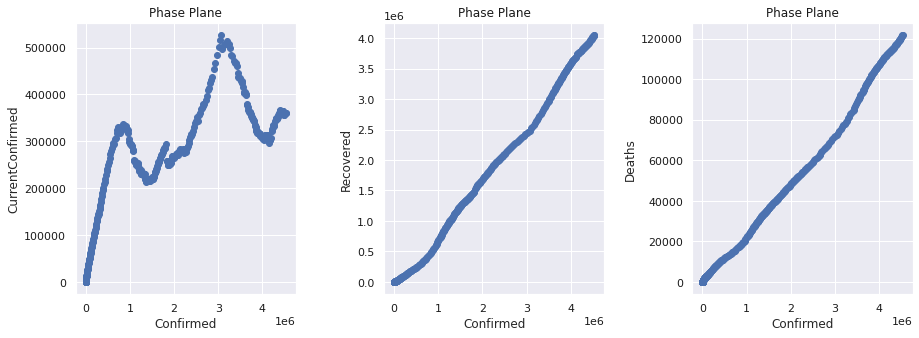

In [75]:
fig = plt.figure(figsize=(15, 5))
fig.subplots_adjust(hspace=0.4, wspace=0.4)
cols = ['CurrentConfirmed', 'Recovered', 'Deaths']
for i in range(1,4):
    ax = fig.add_subplot(1, 3, i)
    ax.scatter( obs[key_feat], obs[cols[i-1]])
    ax.set_xlabel(key_feat)
    ax.set_ylabel(cols[i-1])
    ax.set_title('Phase Plane')

This graph tells us that the spreading of covid 19 in Africa is decreasing everytime. You can see it left to right. 

We can also compute a lethality and recovered rate of covid 19 in findind a slope of phase plane recovered-confirmed and death-confirmed. We obtain.

>**Lethality = 3%**

>**Recovered rate = 97%**

In [76]:
# we import the package 
from scipy.optimize import  minimize,curve_fit
from scipy.integrate import solve_ivp

In [77]:
def find_R0(data=None):
    
    def sumsq(p, obs=None):
        beta ,gamma= p
        
        def SIR_Modified(t,y):
            S =y[0]
            I = y[1]
            R = y[2]
            return([-beta*(S)*I, beta*I*(S) - gamma*I, gamma*I])
    
        n = obs.shape[0]

        sol = solve_ivp(SIR_Modified, [0, n], [1.0e6, 1.0, 0.0], t_eval=np.arange(0, n, 1))
        
    
        m = len(sol.y[1])
        
        
        removal = obs['Recovered'].values + obs['Deaths'].values
        current = obs.CurrentConfirmed.values
        
        l1 = np.sqrt(np.mean((sol.y[0] - removal[:m])**2))
        l2 = np.sqrt(np.mean((sol.y[1] - current[:m])**2))
    
        alpha = 0.1
        return alpha * l2 + (1 - alpha) * l1 
    
    region = data['Country/Region'].unique()
    
    result = {}
    coef = {}
    
    for reg in region:
        df = data[data['Country/Region'] == reg]
        bnds = [(0.00001,0.00009), (0.0001, None)]
        msol = minimize(sumsq,[0.001, 0.0001], args = (df), method='TNC', bounds=bnds)
        
        coef['beta'] = msol.x[0]
        coef['gamma'] =  msol.x[1]
        result[reg] = coef
        
        print(reg, '\t', coef)
    
    return result

In [78]:
def optimize_beta_gamma(data=None):
    
    def sumsq(p, obs=None):
        beta ,gamma = p
        
        def SIR_Modified(t,y):
            S =y[0]
            I = y[1]
            R = y[2]
            return([-beta*S*I, beta*I*S - gamma*I, gamma*I])
    
        n = obs.shape[0]
        _, i0, r0, m0 = obs[['Confirmed', 'CurrentConfirmed', 'Recovered', 'Deaths']].iloc[0].values

        sol = solve_ivp(SIR_Modified, [0, n],[1.0e6, i0, r0+m0],t_eval=np.arange(0, n, 1))
        
    
        m = len(sol.y[1])
        
        
        removal = obs['Recovered'].values + obs['Deaths'].values
        current = obs.CurrentConfirmed.values
        
        l1 = np.sqrt(np.mean((sol.y[0] - removal[:m])**2))
        l2 = np.sqrt(np.mean((sol.y[1] - current[:m])**2))
    
        alpha = 0.1
        return alpha * l1 + (1 - alpha) * l2 
    
    bnds = [(0.0001, 0.0009), (0.0001, None)]
    msol = minimize(sumsq,[0.0001, 0.0001], args = (data), method='TNC', bounds=bnds)
    
    return msol

In [79]:
def solveSIR(p, obs=None):
    beta ,gamma = p
        
    def SIR_Modified(t,y):
        S =y[0]
        I = y[1]
        R = y[2]

        return([-beta*S*I, beta*I*S - gamma*I, gamma*I])
    
    n = obs.shape[0]
    _, i0, r0, m0 = obs[['Confirmed', 'CurrentConfirmed', 'Recovered', 'Deaths']].iloc[0].values

    sol = solve_ivp(SIR_Modified, [0, n],[1.0e6, i0, r0+m0], t_eval=np.arange(0, n, 1))
    return sol

In [80]:
#_ = find_R0(data=data_africa)

**If you are not satisfied with this model you can see this**.

https://www.kaggle.com/lumierebatalong/sars-cov-2-worldwide-transmission-rate-forecasting

https://www.kaggle.com/lumierebatalong/predicting-the-sars-cov-2-spreads-in-cameroon

## Find dynamics or difference system equation using polynomial regression and Prophet

In [81]:
obs.head()

,Confirmed,CurrentConfirmed,Recovered,Deaths
ObservationDate,,,,
2020-01-27,1.0,1.0,0.0,0.0
2020-02-14,1.0,1.0,0.0,0.0
2020-02-15,1.0,1.0,0.0,0.0
2020-02-16,1.0,1.0,0.0,0.0
2020-02-17,1.0,1.0,0.0,0.0


Text(0, 0.5, 'cummulative')

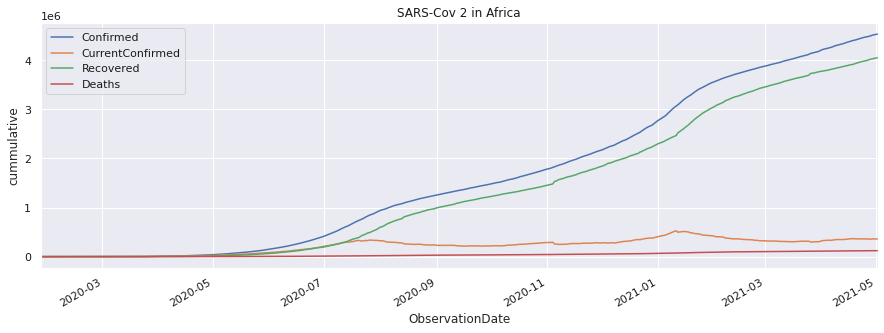

In [82]:
# visualize data
obs.plot(figsize=(15,5), title='SARS-Cov 2 in Africa')
plt.ylabel('cummulative')

In [83]:
def polyRegression(x=None, y=None, degree=1):
    """
        params: x array-like predictor
        params: y array-like target
    
    """
    
    # importing libraries for polynomial transform
    from sklearn.preprocessing import PolynomialFeatures
    # for creating pipeline
    from sklearn.pipeline import Pipeline
    # creating pipeline and fitting it on data
    
    # Importing Linear Regression
    from sklearn.linear_model import LinearRegression

    
    Input=[('polynomial',PolynomialFeatures(degree=degree)),('modal',LinearRegression(normalize=True,fit_intercept=False))]
    pipe=Pipeline(Input)
    pipe.fit(x.reshape(-1, 1), y)
    
    poly_pred=pipe.predict(x.reshape(-1, 1))
    
    #sorting predicted values with respect to predictor
    pred = []
    for i in range(y.shape[1]):
        sorted_zip = sorted(zip(x, poly_pred[:,i]))
        _, poly_pred1 = zip(*sorted_zip)
        pred.append(poly_pred1)
    
    
    return np.asfarray(pred).T, pipe['modal'].coef_, pipe

In [84]:
prediction, coef, model = polyRegression(x=obs[key_feat].values,
                                  y=obs[['Deaths','Recovered','CurrentConfirmed']].values, degree=3)

In [85]:
coef

array([[ 4.03508945e-08,  2.34554870e-02, -3.88468766e-10,
         2.77555756e-16],
       [ 1.14383257e-06,  6.64896038e-01,  8.91818161e-08,
        -8.43769499e-15],
       [ 5.26588910e-07,  3.06099765e-01, -8.70076143e-08,
         8.04911693e-15]])

In [86]:
df_predict = pd.DataFrame(prediction, columns=['Deaths','Recovered','CurrentConfirmed'], index=obs.index)

In [87]:
df_predict.head()

,Deaths,Recovered,CurrentConfirmed
ObservationDate,,,
2020-01-27,0.023456,0.664897,0.3061
2020-02-14,0.023456,0.664897,0.3061
2020-02-15,0.023456,0.664897,0.3061
2020-02-16,0.023456,0.664897,0.3061
2020-02-17,0.023456,0.664897,0.3061


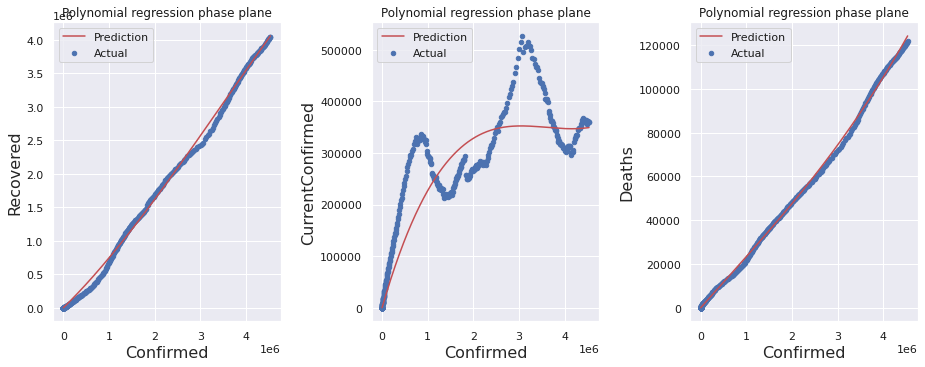

In [88]:
fig= plt.figure(figsize=(15.5,5.5))
fig.subplots_adjust(hspace=0.4, wspace=0.4)
cols = ['Recovered', 'CurrentConfirmed', 'Deaths']
for i in range(1,4):
    ax=fig.add_subplot(1, 3, i)
    ax.scatter(obs[key_feat], obs[cols[i-1]], s=20, label='Actual')
    ax.plot(obs[key_feat], df_predict[cols[i-1]] ,'r', label='Prediction')
    ax.set_xlabel(key_feat,fontsize=16)
    ax.set_ylabel(cols[i-1],fontsize=16)
    ax.legend(loc='best')
    ax.set_title('Polynomial regression phase plane')

In [89]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [90]:
for c in cols:
    score = np.sqrt(mean_squared_error(obs[c] ,df_predict[c]))
    print('{}: RMSE for Polynomial Regression => {}\n'.format(c, score))

Recovered: RMSE for Polynomial Regression => 58653.347134879165

CurrentConfirmed: RMSE for Polynomial Regression => 59301.261157161534

Deaths: RMSE for Polynomial Regression => 1204.1242594970574



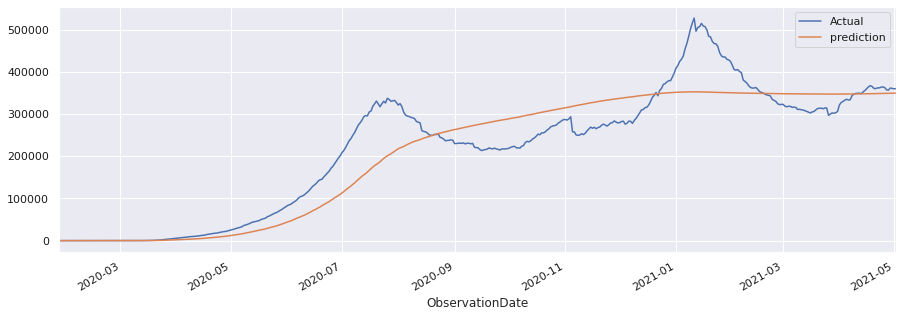

In [91]:
ag = obs.CurrentConfirmed.plot(legend=True,label='Actual', figsize=(15,5))
df_predict.CurrentConfirmed.plot(legend=True, label='prediction', ax=ag)

### time series with Prophet 

In [92]:
#importing package
from fbprophet import Prophet

In [93]:
confirm = obs[key_feat].reset_index()

In [94]:
confirm.head(3)

,ObservationDate,Confirmed
0,2020-01-27,1.0
1,2020-02-14,1.0
2,2020-02-15,1.0


In [95]:
prec = confirm.rename(columns={'ObservationDate':'ds', key_feat:'y'})

In [96]:
prec.head(3)

,ds,y
0,2020-01-27,1.0
1,2020-02-14,1.0
2,2020-02-15,1.0


In [97]:
m = Prophet(interval_width=0.95,changepoint_prior_scale=1.05, yearly_seasonality=False, daily_seasonality=True)
m.fit(prec)

In [98]:
futureDays = m.make_future_dataframe(periods=3)
futureDays.tail(2)

,ds
446,2021-05-04
447,2021-05-05


In [99]:
confirmed_forecast = m.predict(futureDays)

In [100]:
confirmed_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
443,2021-05-01,4.529881e+06,4.520919e+06,4.538733e+06
444,2021-05-02,4.539662e+06,4.530742e+06,4.548352e+06
445,2021-05-03,4.548559e+06,4.540640e+06,4.556944e+06
446,2021-05-04,4.557714e+06,4.549208e+06,4.566383e+06
447,2021-05-05,4.569293e+06,4.559684e+06,4.578215e+06


Text(0.5, 1.0, 'Confirmed Africa forecasting')

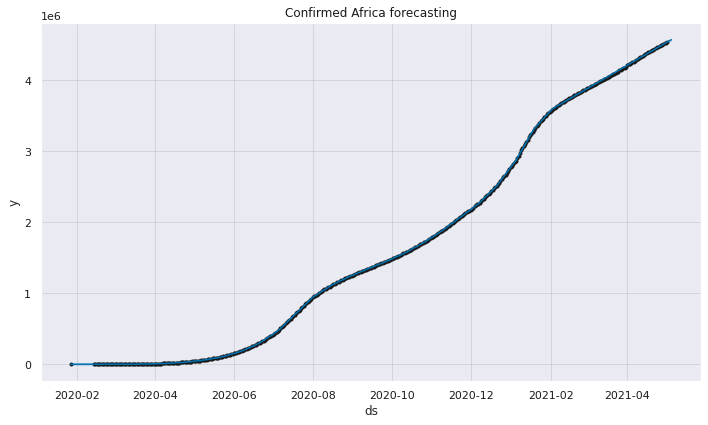

In [101]:
graph = m.plot(confirmed_forecast)
plt.title('Confirmed Africa forecasting')

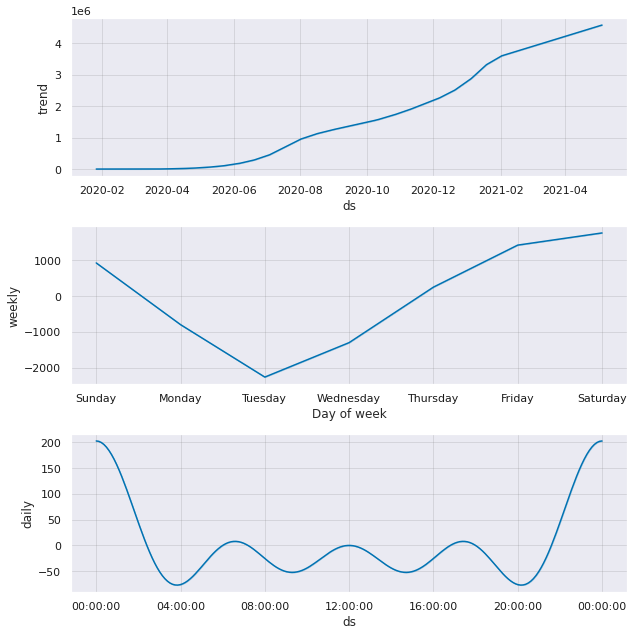

In [102]:
graph1 = m.plot_components(confirmed_forecast)

**Diagnotics**

In [103]:
from fbprophet.diagnostics import cross_validation
from fbprophet.diagnostics import performance_metrics

In [104]:
#for cross validation we are taking the range of our data 
df_cv = cross_validation(m, initial='34 days', period='1 days', horizon = '15 days')
df_cv.head(3)

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2020-03-02,4.102082,3.843457,4.361539,8.0,2020-03-01
1,2020-03-03,4.854772,4.553520,5.110230,11.0,2020-03-01
2,2020-03-04,5.100475,4.758037,5.421359,21.0,2020-03-01


In [105]:
df_p = performance_metrics(df_cv)
df_p.head(3)

,horizon,mse,rmse,mae,mape,mdape,coverage
0,2 days,5.462822e+09,73910.903696,47885.421979,0.049720,0.036617,0.079086
1,3 days,6.169613e+09,78546.885359,51614.524050,0.059440,0.037824,0.069408
2,4 days,6.933718e+09,83268.950231,55429.794127,0.068366,0.044829,0.066181


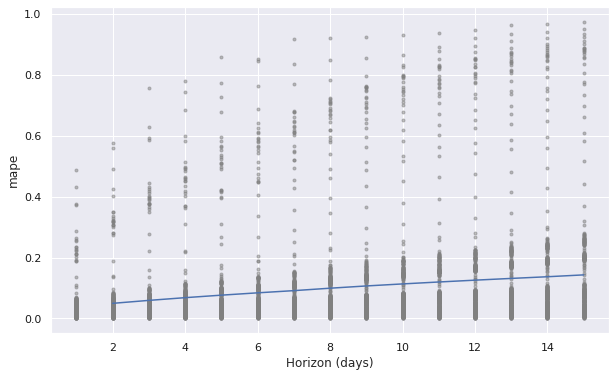

In [106]:
from fbprophet.plot import plot_cross_validation_metric
ufig = plot_cross_validation_metric(df_cv, metric='mape')

After having find the model that can help to forecast Confirmed in the next time. we are also forecasting Recovered, CurrentConfirmed and Deaths using Polynomial regression.

In [107]:
pred_data = confirmed_forecast[confirmed_forecast['ds'].isin(futureDays.ds)]

In [108]:
pforecast_lower = pd.DataFrame(model.predict(pred_data.yhat_lower.values.reshape(-1,1)), 
                               columns=['Deaths','Recovered','CurrentConfirmed'],
                         index=futureDays.ds)

In [109]:
pforecast = pd.DataFrame(model.predict(pred_data.yhat.values.reshape(-1,1)),
                         columns=['Deaths','Recovered','CurrentConfirmed'],
                         index=futureDays.ds)

In [110]:
pforecast_upper = pd.DataFrame(model.predict(pred_data.yhat_upper.values.reshape(-1,1)), 
                               columns=['Deaths','Recovered','CurrentConfirmed'],
                         index=futureDays.ds)

In [111]:
# function for plotting
def viewing_forecast(actual=None, lower=None, forecast=None, upper=None, title=None):
    
    
    plt.figure(figsize=(15, 5.5))
    ax = plt.plot(forecast, color='blue', label='Forecast')
    
    nd = len(actual)
    time = forecast.index[:nd]
    plt.scatter(time, actual, label='Actual', color='black')
    
    plt.fill_between(forecast.index, lower, upper, alpha=0.9, color='orange')
    
    #a = actual.index.to_list()
    #b = actual.index.max()
    #n = a.index(b)
    #pmax = forecast.max()
   # plt.vlines(n, actual.min(), pmax, linestyles='dashdot', colors='black',
    #          label='stop actual')
    
    #bbox = dict(boxstyle="round", fc='0.8')
    #arrowprops = dict(arrowstyle='->', connectionstyle='angle, angleA=0, angleB=100, rad=10', 
     #                 facecolor='black')
    
    #offset = 72
    
    #ax.annotate('Actual-Prediction', (actual.index.max(), actual.max()+10), xytext=(-2*offset, offset), 
          #      textcoords='offset points', bbox=bbox, arrowprops=arrowprops)
    
    #disp = ax.annotate('Forecasting', (actual.index.max(), actual.max()+5), xytext=(0.5*offset, -offset),
     #           textcoords='offset points', bbox=bbox, arrowprops=arrowprops)
    
    
    plt.xlabel('Date')
    plt.ylabel('Cumulative')
    plt.title('{} Africa Forecasting'.format(title))
    plt.legend(loc='best')  

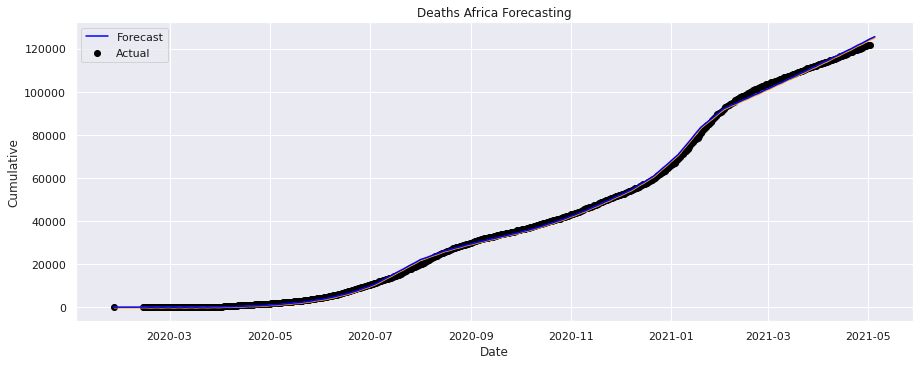

In [112]:
viewing_forecast(actual=obs['Deaths'], lower=pforecast_lower['Deaths'], forecast=pforecast['Deaths'], 
                 upper=pforecast_upper['Deaths'], title='Deaths')

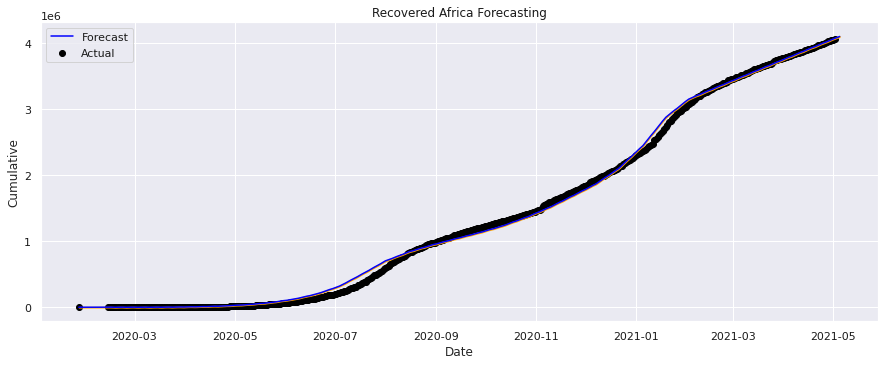

In [113]:
viewing_forecast(actual=obs['Recovered'],lower=pforecast_lower['Recovered'], forecast=pforecast['Recovered'] , 
                 upper=pforecast_upper['Recovered'] ,
                 title='Recovered')

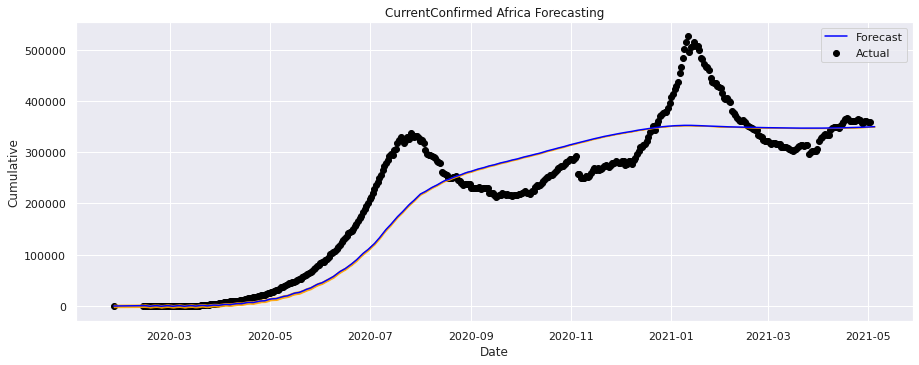

In [114]:
viewing_forecast(actual=obs['CurrentConfirmed'],lower=pforecast_lower['CurrentConfirmed'], 
                 forecast=pforecast['CurrentConfirmed'] , 
                 upper=pforecast_upper['CurrentConfirmed'] ,
                 title='CurrentConfirmed')

**Difference system equation**

From above, we can approximate our data as follows:

**X --> Confirmed**

**Y --> Deaths**

**Z --> Recovered**

**I --> Current Confirmed**

And we obtain the difference equations below:

>$Y_{t} = a_{0} + a_{1}X_{t} + a_{2}X_{t}^{2}$

>$Z_{t} = b_{0} + b_{1}X_{t} + b_{2}X_{t}^{2}$

>$I_{t} = c_{0} + c_{1}X_{t} + c_{2}X_{t}^{2}$

Where $a_{0}, a_{1}, a_{2}, b_{0}, b_{1}, b_{2}, c_{0}, c_{1}, c_{2}$ are coefficient determinate above using Polynomial regression.

We have also:
> $ X_{t} = \phi_{0} + \phi_{1}X_{t-1} + \phi_{2}X_{t-2} + ... + \phi_{p}X_{t-p} + \epsilon_{t}$ where all coefficient determinate using Prophet.

From the curve below, we can rewrite $X_{t}$ as follows:

> $ X_{t} = \alpha + \phi_{1} X_{t-1} + \epsilon_{t}$

In [115]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

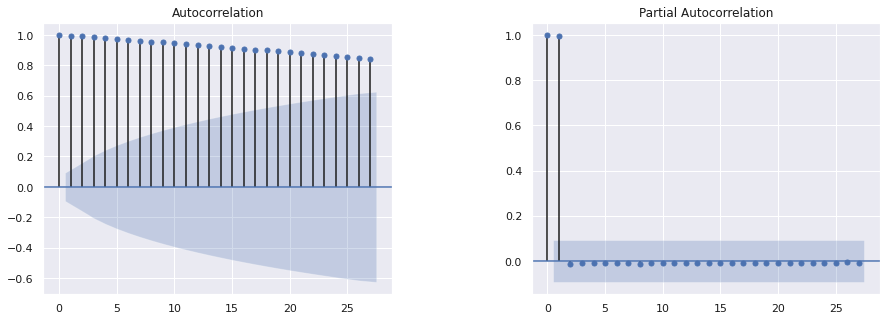

In [116]:
fg = plt.figure(figsize=(15, 5))
fg.subplots_adjust(hspace=0.4, wspace=0.4)
axis1 = fg.add_subplot(1, 2, 1)
axis2 = fg.add_subplot(1, 2, 2)
_ = plot_acf(obs.Confirmed.values, ax=axis1)
_ = plot_pacf(obs.Confirmed.values, ax=axis2)

### New confirmed cases,  New recovered, New deaths


>new confirmed = currentConfirmed next day - currentConfirmed previous day.

>>$\psi_{t} = I_{t+\tau} - I_{t}$ 

>new recovered = recovered next day - recovered previous day

>>$R = Z_{t+\tau} - Z_{t}$

>new deaths = deaths next day - deaths previous day
>> $D = Y_{t+\tau} - Y_{t}$

In [117]:
def new_rate(data=None):
    x = []
    x.append(0)
    for i in range(data.shape[0]-1):
        a = data.iloc[i+1]-data.iloc[i]
        x.append(a)
        
    return np.array(x)

In [118]:
new_CRD  = pd.DataFrame(new_rate(obs.Confirmed), columns=['new_confirmed'], index = obs.index)

In [119]:
new_CRD['new_recovered'] = new_rate(obs.Recovered)
new_CRD['new_deaths'] = new_rate(obs.Deaths)

In [120]:
new_CRD.head()

,new_confirmed,new_recovered,new_deaths
ObservationDate,,,
2020-01-27,0.0,0.0,0.0
2020-02-14,0.0,0.0,0.0
2020-02-15,0.0,0.0,0.0
2020-02-16,0.0,0.0,0.0
2020-02-17,0.0,0.0,0.0


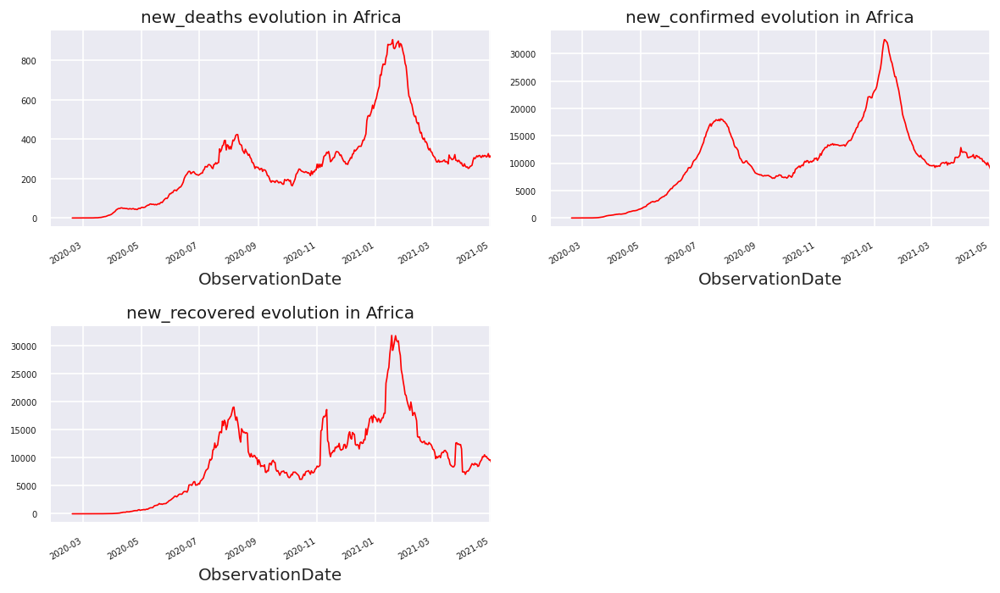

In [121]:
pict = plt.figure(dpi=120, figsize=(10,6))
pict.subplots_adjust(hspace=0.4, wspace=0.4)
for i, _ in enumerate(new_CRD.columns):
    ax = pict.add_subplot(2,2,i+1)
    data = new_CRD[new_CRD.columns[i-1]].rolling(window=7).mean()
    data.plot(ax=ax, color='red', linewidth=1)
    # Decorations
    ax.set_title(new_CRD.columns[i-1]+' evolution in Africa')
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout();

Normally, the spreading of covid 19 in Africa is dying every day.

## VAR Model for new confirmed, recovered, deaths

**Testing Causation using Granger’s Causality Test**

The basis behind Vector AutoRegression is that each of the time series in the system influences each other. That is, you can predict the series with past values of itself along with other series in the system.

Using Granger’s Causality Test, it’s possible to test this relationship before even building the model.

So what does Granger’s Causality really test?

Granger’s causality tests the null hypothesis that the coefficients of past values in the regression equation is zero.

In simpler terms, the past values of time series (X) do not cause the other series (Y). So, if the p-value obtained from the test is lesser than the significance level of 0.05, then, you can safely reject the null hypothesis.

**Extract**: https://www.machinelearningplus.com/time-series/vector-autoregression-examples-python/

see below the code:

In [122]:
from statsmodels.tsa.stattools import grangercausalitytests

def grangers_causation_matrix(data, variables, verbose=False, test='ssr_chi2test',maxlag=12): 
    
    """
    Check Granger Causality of all possible combinations of the Time series.
    The rows are the response variable, columns are predictors. The values in the table 
    are the P-Values. P-Values lesser than the significance level (0.05), implies 
    the Null Hypothesis that the coefficients of the corresponding past values is 
    zero, that is, the X does not cause Y can be rejected.

    data      : pandas dataframe containing the time series variables
    
    variables : list containing names of the time series variables.
    
    """
    
    df = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
    for c in df.columns:
        for r in df.index:
            test_result = grangercausalitytests(data[[r, c]], maxlag=maxlag, verbose=False)
            p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
            if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
            min_p_value = np.min(p_values)
            df.loc[r, c] = min_p_value
    df.columns = [var + '_x' for var in variables]
    df.index = [var + '_y' for var in variables]
    return df

In [123]:
grangers_causation_matrix(new_CRD, variables = new_CRD.columns)

,new_confirmed_x,new_recovered_x,new_deaths_x
new_confirmed_y,1.0,0.0,0.0
new_recovered_y,0.0,1.0,0.0
new_deaths_y,0.0,0.0,1.0


**Result interpretation**

The row are the Response (Y) and the columns are the predictor series (X). For example, if you take the value 0.0 in (row 1, column 2), it refers to the p-value of new_recovered_x causing new_confirmed_y. Whereas, the 0.0 in (row 2, column 1) refers to the p-value of new_confirmed_y causing new_recovered_x.

If a given p-value is < significance level (0.05), then, the corresponding X series (column) causes the Y (row). See table above.

#### Stationarities using Cointegration Johanssen test

In [124]:
#checking stationarity
from statsmodels.tsa.vector_ar.vecm import coint_johansen

In [125]:
coint_johansen(new_CRD, -1, 1).eig # if all absolute eigen values are less than 1 data are stationary

array([0.24462375, 0.12737471, 0.00465107])

In [126]:
# we split our data
n_size = int(0.9*new_CRD.shape[0])
train = new_CRD[:n_size]
valid = new_CRD[n_size:]

print('train shape: {}\nvalid shape: {}'.format(train.shape, valid.shape))

train shape: (400, 3)
valid shape: (45, 3)


In [127]:
from statsmodels.tsa.vector_ar.var_model import VAR

In [128]:
var_model = VAR(endog=train)

In [129]:
var_result = var_model.fit(maxlags=5, ic='aic')

In [130]:
var_result.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Tue, 04, May, 2021
Time:                     23:34:22
--------------------------------------------------------------------
No. of Equations:         3.00000    BIC:                    40.3841
Nobs:                     395.000    HQIC:                   40.0922
Log likelihood:          -9513.81    FPE:                2.13137e+17
AIC:                      39.9006    Det(Omega_mle):     1.89202e+17
--------------------------------------------------------------------
Results for equation new_confirmed
                      coefficient       std. error           t-stat            prob
-----------------------------------------------------------------------------------
const                  335.476911       144.197067            2.327           0.020
L1.new_confirmed         0.612588         0.053461           11.459           0.000
L1.new_recovered         0.041198       

##### Evaluation

In [131]:
pred = var_result.forecast(train.values, len(valid))

In [132]:
for i, col in enumerate(valid.columns):
    print('{} rmse score: {}'.format(col, (mean_absolute_error(pred[i-1], valid.values[i-1]))))

new_confirmed rmse score: 3037.324703548115
new_recovered rmse score: 1290.3285825117048
new_deaths rmse score: 967.1972752495109


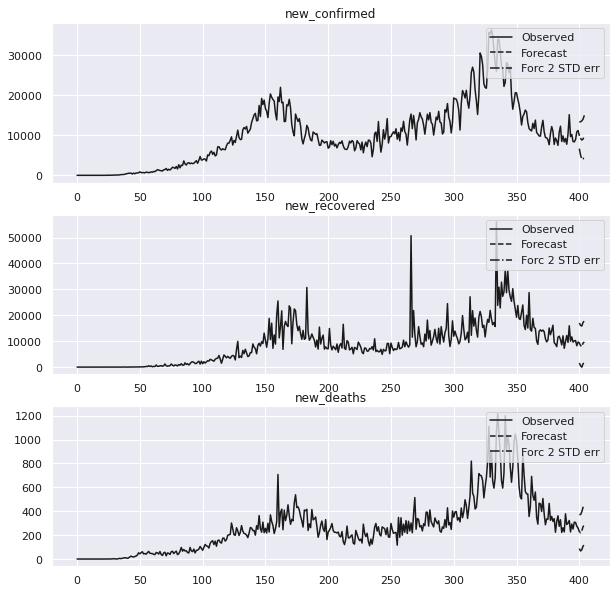

In [133]:
_= var_result.plot_forecast(5)

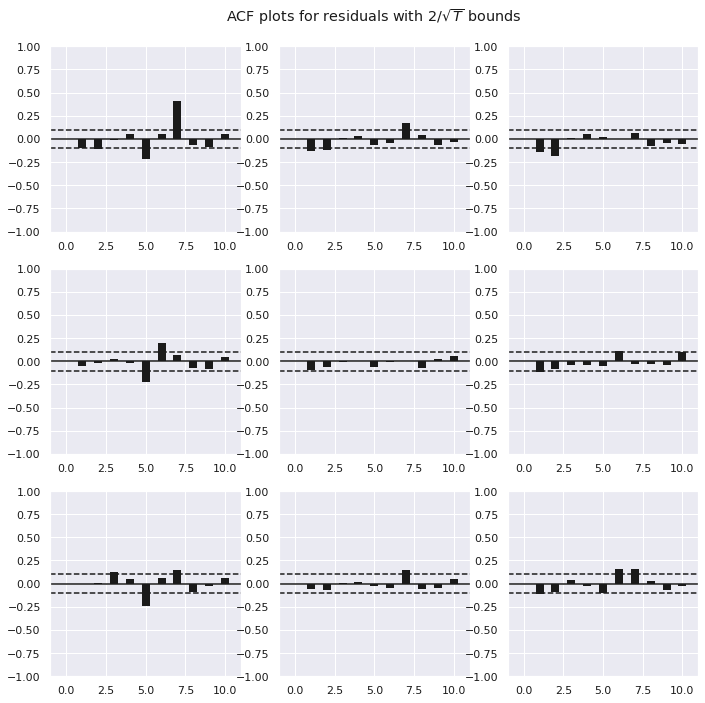

In [134]:
_=var_result.plot_acorr()

### Impulse-Response function

In [135]:
irf = var_result.irf(10)

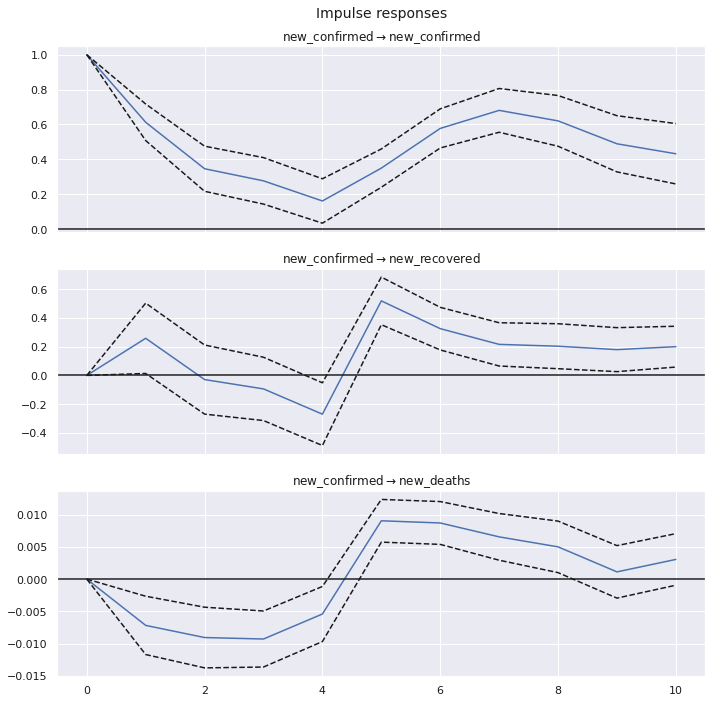

In [136]:
_ = irf.plot(impulse='new_confirmed')

This graph, we show that the response of new recovered opposite to the impulse of new confirmed.  

## Forecasting

In [137]:
mitigate = VAR(endog=new_CRD)
res = mitigate.fit(maxlags=5, ic='aic')

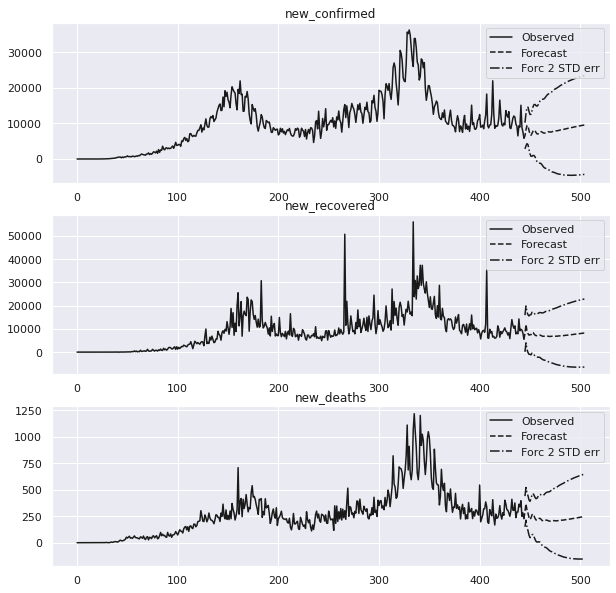

In [138]:
_=res.plot_forecast(steps=60, plot_stderr=True)

Our model says that in the **2 months** the new confirmed case will be down.

# is covid 19 dying in Africa?

We are going to see in another graph if covid is dying in Africa using Phase Plane.

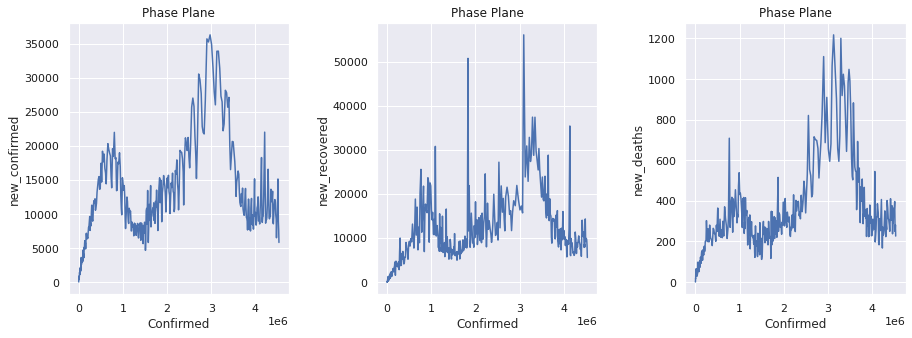

In [139]:
figo = plt.figure(figsize=(15, 5))
figo.subplots_adjust(hspace=0.4, wspace=0.4)
cols = ['new_confirmed', 'new_recovered', 'new_deaths']
for i in range(1,4):
    ax = figo.add_subplot(1, 3, i)
    ax.plot( obs[key_feat], new_CRD[cols[i-1]])
    ax.set_xlabel(key_feat)
    ax.set_ylabel(cols[i-1])
    ax.set_title('Phase Plane')

The New confirmed Case are currently down. Also new recovered and new deaths. Yes Covid 19 is ready to die in Africa.

# Which African countries are they similar?

African countries are similar if they have a similar in Deaths, Recovered, confirmed case and incidence.

In [140]:
# define a function
def similar_country(country=None, data=None, n=6):
    """
        This function give a top n country that are similar with a target country
        country is a target country
        data is dataframe data
        n int.
    
    """
    #compute cosine similarity
    def cosine_similarity(a, b): 
        return a.dot(b.T)/(np.linalg.norm(a, 2)*np.linalg.norm (b, 2))
    
    df = {} #we create a dictionary
    
    data = data[data.index == data.index.max()] #we take a last date.
    
    pyers = data[data['Country/Region'] == country] #interested country
    
    pyers = pyers.drop(columns='Country/Region').values #remove this columns and take values
    
    
    all_country = list(set(data['Country/Region'].unique()) - set(country)) # all country except taeget country
    
    for u in all_country:
        
        prod = data[data['Country/Region'] == u].drop(columns='Country/Region').values# we take values
        
        xv = cosine_similarity(pyers, prod) # we compute cosine similarity
    
        df[u] = {country: xv[0][0]} # add result in the dict
        
    xd =  pd.DataFrame(df)

    return xd.T.sort_values(by=country, ascending=False)[:n]

In [141]:
# we sort values
africa_cov['ObservationDate'] = pd.to_datetime(africa_cov['ObservationDate'])
africasim = africa_cov.sort_values(by=['ObservationDate', 'Country/Region'], axis=0, ascending=True)

In [142]:
#we compute incidence in each country
incidence = []
for name in africa_cov['Country/Region'].unique():
    
    #we take a country
    country = africasim[africasim['Country/Region'] == name]
    
    #compute incidence
    country['incidence'] = country['Confirmed'].diff()
    
    incidence.append(country)

In [143]:
similar_africa = pd.concat(incidence)

In [144]:
similar_africa.tail()

,SNo,ObservationDate,Country/Region,Last Update,Confirmed,Deaths,Recovered,CurrentConfirmed,incidence
19989,281574,2021-04-28,Lesotho,2021-04-29 04:20:55,10730.0,316.0,6267.0,4147.0,2.0
20038,282338,2021-04-29,Lesotho,2021-04-30 04:21:03,10731.0,316.0,6267.0,4148.0,1.0
20087,283102,2021-04-30,Lesotho,2021-05-01 04:20:47,10731.0,316.0,6267.0,4148.0,0.0
20136,283866,2021-05-01,Lesotho,2021-05-02 04:20:48,10731.0,316.0,6267.0,4148.0,0.0
20185,284630,2021-05-02,Lesotho,2021-05-03 04:20:39,10733.0,318.0,6267.0,4148.0,2.0


In [145]:
#we set ObservationDate to index
similar_africa = similar_africa.set_index('ObservationDate')

In [146]:
del similar_africa['SNo']
del similar_africa['Last Update']
del similar_africa['CurrentConfirmed']

In [147]:
similar_africa.tail()# 

,Country/Region,Confirmed,Deaths,Recovered,incidence
ObservationDate,,,,,
2021-04-28,Lesotho,10730.0,316.0,6267.0,2.0
2021-04-29,Lesotho,10731.0,316.0,6267.0,1.0
2021-04-30,Lesotho,10731.0,316.0,6267.0,0.0
2021-05-01,Lesotho,10731.0,316.0,6267.0,0.0
2021-05-02,Lesotho,10733.0,318.0,6267.0,2.0


In [148]:
#we see our countries
similar_africa['Country/Region'].unique()

array(["Côte d'Ivoire", 'Egypt', 'Algeria', 'Nigeria', 'Morocco',
       'Senegal', 'Tunisia', 'South Africa', 'Cameroon', 'Togo',
       'Burkina Faso', 'Dem. Rep. Congo', 'Ethiopia', 'Sudan', 'Guinea',
       'Kenya', 'Ghana', 'Namibia', 'eSwatini', 'Gabon', 'Mauritania',
       'Rwanda', 'Central African Rep.', 'Congo', 'Eq. Guinea', 'Benin',
       'Liberia', 'Somalia', 'Tanzania', 'Zambia', 'Djibouti', 'Chad',
       'Madagascar', 'Angola', 'Niger', 'Zimbabwe', 'Eritrea', 'Uganda',
       'Gambia', 'Mozambique', 'Libya', 'Guinea-Bissau', 'Mali',
       'Botswana', 'Burundi', 'Sierra Leone', 'Malawi', 'S. Sudan',
       'Lesotho'], dtype=object)

In [149]:
cameroon = similar_country(country='Cameroon', data=similar_africa.dropna())
cameroon

,Cameroon
Cameroon,1.000000
Somalia,0.997862
Lesotho,0.997160
Mali,0.994216
Tanzania,0.993768
Kenya,0.989910


In [150]:
nigeria = similar_country(country='Nigeria', data=similar_africa.dropna())
south_africa = similar_country(country='South Africa', data=similar_africa.dropna())

In [151]:
nigeria

,Nigeria
Nigeria,1.000000
Eq. Guinea,0.999992
Rwanda,0.999983
Namibia,0.999982
Mozambique,0.999959
Eritrea,0.999954


In [152]:
south_africa

,South Africa
South Africa,1.000000
eSwatini,0.999986
Malawi,0.999982
Mauritania,0.999964
Senegal,0.999949
Zimbabwe,0.999925


Text(0.5, 1.0, 'The 5 countries that are similar with cameroon')

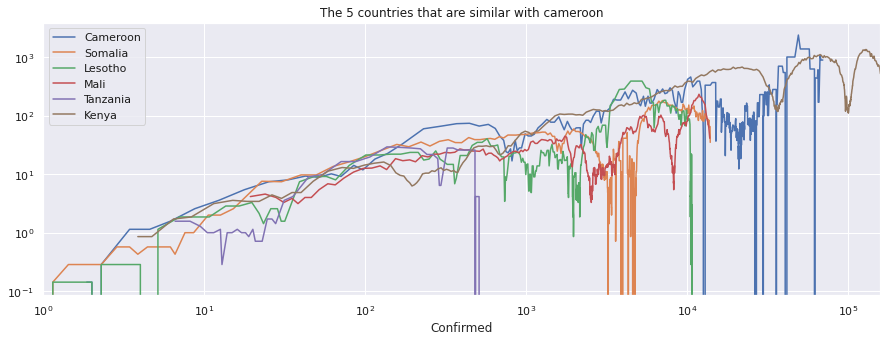

In [153]:
ax = similar_africa[similar_africa['Country/Region'] == cameroon.index[0]].rolling(window=7).mean().plot(x='Confirmed', y='incidence',\
                                                                           label=cameroon.index[0],\
                                                                           logy=True,logx=True, figsize=(15,5))

similar_africa[similar_africa['Country/Region'] == cameroon.index[1]].rolling(window=7).mean().plot(x='Confirmed', y='incidence',\
                                                                           label=cameroon.index[1],\
                                                                           logy=True,logx=True, figsize=(15,5), ax=ax)

similar_africa[similar_africa['Country/Region'] == cameroon.index[2]].rolling(window=7).mean().plot(x='Confirmed', y='incidence',\
                                                                           label=cameroon.index[2],\
                                                                           logy=True,logx=True, figsize=(15,5), ax=ax)

similar_africa[similar_africa['Country/Region'] == cameroon.index[3]].rolling(window=7).mean().plot(x='Confirmed', y='incidence',\
                                                                           label=cameroon.index[3],\
                                                                           logy=True,logx=True, figsize=(15,5), ax=ax)

similar_africa[similar_africa['Country/Region'] == cameroon.index[4]].rolling(window=7).mean().plot(x='Confirmed', y='incidence',\
                                                                           label=cameroon.index[4],\
                                                                           logy=True,logx=True, figsize=(15,5), ax=ax)

similar_africa[similar_africa['Country/Region'] == cameroon.index[5]].rolling(window=7).mean().plot(x='Confirmed', y='incidence',\
                                                                           label=cameroon.index[5],\
                                                                           logy=True,logx=True, figsize=(15,5), ax=ax)

plt.title('The 5 countries that are similar with cameroon')

# UPNEXT!

### Disclaimer

This notebook does not affirm that all the models are exact it just offers a track to better understand and fight effectively against this pandemic in the world. Thank you